In [1]:
import numpy as np
import healpy as hp

import matplotlib
from matplotlib import pyplot as plt

from scipy import stats
import matplotlib.gridspec as gridspec
import astropy.cosmology.units as cu
import astropy.units as u
import site
site.addsitedir('/oak/stanford/orgs/kipac/users/mahlet/quaia_bias/scripts') 
import quaia
import seaborn as sns
from matplotlib.colors import LogNorm
import matplotlib.patches as mpatches
import pyccl as ccl
from matplotlib.lines import Line2D
from matplotlib import cm
from scipy.optimize import minimize
from astropy.cosmology import Planck18
from dynesty import NestedSampler
from dynesty import plotting as dyplot
from dynesty import utils as dyfunc
from astropy.coordinates import SkyCoord
from healpy.newvisufunc import projview
from scipy import special
from scipy import linalg
from scipy.special import gamma

In [2]:
matplotlib.rcParams['ytick.labelsize'] = 18
matplotlib.rcParams['xtick.labelsize'] = 18
matplotlib.rcParams['axes.labelsize'] = 22
matplotlib.rcParams['legend.fontsize'] = 18
matplotlib.rcParams['axes.titlesize'] = 20

# Model using erfc HOD
## Define parameters

In [3]:
G_hi = 20.5

In [4]:
nthreads = 18

In [5]:
z_bins = np.array([0.0, 1.0, 2.0, 3.0, 4.6])
z_array = range(len(z_bins)-1)
mask = 0.5

In [6]:
cosmo_planck18 = ccl.Cosmology(Omega_c=0.265, Omega_b=Planck18.Ob0, h=Planck18.h, Neff = Planck18.Neff, T_CMB = Planck18.Tcmb0.value, m_nu = Planck18.m_nu, sigma8=0.8, n_s=0.95)

In [7]:
Delta = 200
delta_c = 1.686

In [8]:
hmf = ccl.halos.MassFuncTinker10()

In [9]:
NSIDE = 64

In [10]:
M_max = 15

## Define functions

In [11]:
def a_median(tab_datahi_mask_zbin0, key_zbin0 = ''):
    return 1/(1+np.median(tab_datahi_mask_zbin0['redshift_quaia'+key_zbin0]))

In [12]:
def b_qso(xi_qq, xi_mm, f):
    
    return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3

In [13]:
def nu(M, delta_c = delta_c, a = 1, cosmo = cosmo_planck18):
    
    sigma = cosmo.sigmaM(M, a = a)
   
    return delta_c/sigma

In [14]:
def n_g_theory(bins, n_total, a = 1, cosmo = cosmo_planck18, hmf = hmf, recenter = True):
    """calculates the number density"""

    if recenter == True:
        bins = quaia.recenter(bins)
    nm = hmf(cosmo, bins, a)/cosmo['h']**3
    n_g = nm/(bins*np.log(10))*n_total
    n_g[np.isnan(n_g)]=0
    
    return n_g, nm

def bias(bins, n_m, a = 1, cosmo = cosmo_planck18, mod = False, recenter = True):
    """returns the bias and number density"""

    n_g, nm = n_g_theory(bins, n_m, a = a, cosmo = cosmo, recenter = recenter)
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
    n_g = np.trapz(n_g, bins)
    dn_dm = nm/(bins*np.log(10))

    b1_E_tinker = b1_E_func(nu(bins, a = a, cosmo = cosmo), mod = mod)

    n_m[~np.isfinite(n_m)]=0 
    integrand = dn_dm*n_m
    integrand[np.isnan(integrand)]=0
    
    return bias_function(n_g, integrand, b1_E_tinker, bins, recenter = recenter), n_g

In [15]:
def b1_E_func(nu, Delta = Delta, delta_c = delta_c, mod = False):
    """calculates the halo bias"""

    delta_c = 1.686
    
    if mod == False:
        y = np.log10(Delta)
        A =  1.0+0.24*y*np.exp(-(4/y)**4)
        a = 0.44*y-0.88
        B = 0.183
        b =  1.5
        C = 0.019+0.107*y+0.19*np.exp(-(4/y)**4)
        c = 2.4
        
    else:
        A =  1.0
        a = 0.0906
        B = -4.5002
        b =  2.1419
        C = 4.9148
        c = 2.1419
        
    return 1-A*nu**a/(nu**a+delta_c**a)+B*nu**b+C*nu**c # Jose et al
    
def bias_function(n_g, integrand, b, bins, recenter = True):
    """ integrates the bias"""
    
    if recenter == True:
        print('recentering')
        bins = quaia.recenter(bins)
        
    return 1/n_g*np.trapz(integrand*b, bins)

In [16]:
def cf_2h(bins, n_m, a, cosmo, cf_matter, recenter = True):
    """implements the 2halo term"""
    
    b_q, n_g = bias(bins, n_m, a, cosmo, recenter = recenter)
    return b_q**2*cf_matter, b_q

In [17]:
def M(bins, n_m, a = 1, cosmo = cosmo_planck18, mod = False, recenter = True, hmf = hmf):

    n_g, nm = n_g_theory(bins, n_m, a = a, cosmo = cosmo, recenter = recenter, hmf = hmf)
    if recenter == True:
        n_g = np.trapz(n_g, quaia.recenter(bins))
        dm = np.diff(bins) 
        dn_dm = nm/(quaia.recenter(bins)*np.log(10))
    else:
        n_g = np.trapz(n_g, bins)
        dn_dm = nm/(bins*np.log(10))

    n_m[~np.isfinite(n_m)]=0 
    integrand = dn_dm*n_m
    integrand[np.isnan(integrand)]=0
    
    if recenter == True:
        return bias_function(n_g, integrand, quaia.recenter(bins), bins, recenter = recenter), n_g
    else:
        return bias_function(n_g, integrand, bins, bins, recenter = recenter), n_g

In [18]:
def HOD(bins, M_min, fduty):

    n_m=np.zeros(np.shape(quaia.recenter(bins)))
    n_m[quaia.recenter(bins)>=M_min]=fduty

    return n_m

In [19]:
def n_DM(cosmo, a, M_min, hmf = hmf, M_max = M_max, N = 79): #16.8
    
    bins = np.logspace(M_min, M_max, N)
    nm = hmf(cosmo, bins, a)/cosmo['h']**3 #/u.Mpc**3 # convert to h/Mpc**3
    dn_dm = nm/(bins*np.log(10))
    
    return np.trapz(dn_dm, bins)

# Implement halo model
## Plot HOD: $\langle N\left(M\right)\rangle=\frac{f_{\text {duty }}}{2} \operatorname{erfc}\left[\frac{\ln (M_\mathrm{min} / M)}{\sqrt{2} \log{10} \Sigma}\right]$
### At fixed $f_{duty}$ and $M_{min}$

In [20]:
n_bins = 79 #159

In [21]:
bins = np.logspace(9, M_max, n_bins)

In [22]:
M_min_array_old = [12.86, 12.74, 12.79, 12.82]
M_min_array = [11.94, 11.98, 11.97, 12.07]

In [23]:
fduty_old = [0.018, 0.022, 0.056, 0.071]
fduty = [0.002, 0.002, 0.003, 0.002]

def HOD_scatter(fduty, M_min, M, sigma):
    
    return fduty/2*special.erfc(np.log(10**M_min/M)/(np.sqrt(2)*np.log(10)*sigma))

In [24]:
cmap_blue = plt.get_cmap('Blues')(np.linspace(0.333, 0.999, len(z_array)))

<>:15: SyntaxWarning: invalid escape sequence '\l'
<>:24: SyntaxWarning: invalid escape sequence '\o'
<>:31: SyntaxWarning: invalid escape sequence '\S'
<>:15: SyntaxWarning: invalid escape sequence '\l'
<>:24: SyntaxWarning: invalid escape sequence '\o'
<>:31: SyntaxWarning: invalid escape sequence '\S'
/tmp/ipykernel_94396/2586165201.py:15: SyntaxWarning: invalid escape sequence '\l'
  ax1.plot(bins_i, n_m, linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
/tmp/ipykernel_94396/2586165201.py:24: SyntaxWarning: invalid escape sequence '\o'
  ax1.set_xlabel('$M (M_\odot)$')
/tmp/ipykernel_94396/2586165201.py:31: SyntaxWarning: invalid escape sequence '\S'
  ax1.set_title('$\Sigma={}$ dex'.format(sigma_array[j]))
/tmp/ipykernel_94396/480457471.py:6: RuntimeWarning: divide by zero encountered in divide
  return fduty/2*special.erfc(np.log(10**M_min/M)/(np.sqrt(2)*np.log(10)*sigma))
/tmp/ipykernel_94396/480457471.py:6: RuntimeWarning: invalid value enco

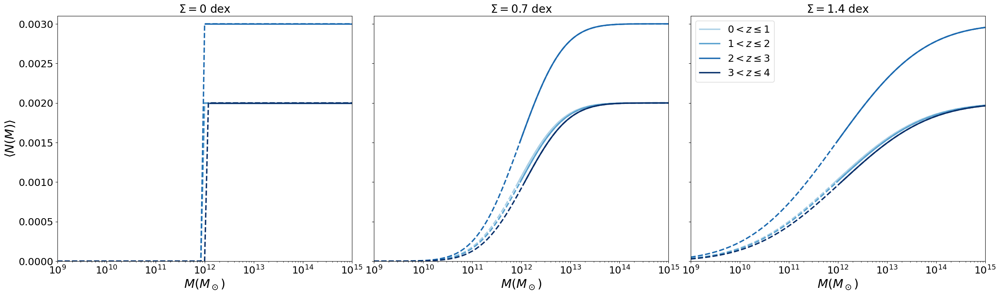

In [25]:
fig = plt.figure(figsize = (30, 8))
gs = gridspec.GridSpec(1, 3, wspace = 0.075)
sigma_array = [0, 0.7, 1.4]
n_m_array, bins_M_min = [], []

for j in range(len(sigma_array)):
    
    ax1 = fig.add_subplot(gs[j])
        
    for i in z_array:
        
        bins_i = np.logspace(M_min_array[i], M_max, n_bins)

        n_m = HOD_scatter(fduty[i], M_min_array[i], bins_i, sigma_array[j])
        ax1.plot(bins_i, n_m, linewidth = 2.5, label = '${:.0f}<z \leq{:.0f}$'.format(i, i+1), color = cmap_blue[i])
        ax1.plot(bins, HOD_scatter(fduty[i], M_min_array[i], bins, sigma_array[j]), linewidth = 2.5, linestyle ='--', color = cmap_blue[i])

        if j == 0:
            
            n_m_array.append(n_m)
            bins_M_min.append(bins_i)
    
    ax1.set_xscale('log')
    ax1.set_xlabel('$M (M_\odot)$')
    
    if j== 0:
        ax1.set_ylabel(r'$\langle N(M) \rangle$')
    else:
        ax1.set_yticklabels([])
    
    ax1.set_title('$\Sigma={}$ dex'.format(sigma_array[j]))
    ax1.set_xlim(1e9,10**M_max)
    ax1.set_ylim(0, 0.0031)
    
    print()
    
ax1.legend()
plt.show()

## Calculate $b_{\mathrm{qq}}(s,z)=\sqrt{\frac{\xi^{(s)}_{\mathrm{qq}}(s)}{\xi^{(r)}_\mathrm{mm}(r)}-\frac{4 \Omega_{\mathrm{m}}^{1.2}(z)}{45}}-\frac{\Omega_{\mathrm{m}}^{0.6}(z)}{3}$
### Use a 50th percentile mask

In [26]:
bins_M_min_array = [np.logspace(np.log10(bins[j]), M_max, n_bins) for j in range(len(bins))]

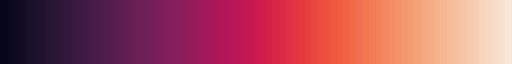

In [27]:
cmap = sns.color_palette("rocket", n_colors = len(bins))
palette = matplotlib.colors.ListedColormap(cmap)
palette

# Calculate derived parameters
## Plot b(z)

In [28]:
def b_eboss(z):
    
    return 0.278*((1+z)**2-6.565) + 2.393

def b_quaia(b_0, a, cosmo = cosmo_planck18): #quaia):
    
    return b_0/ccl.growth_factor(cosmo, a)

In [29]:
b_cf20 = np.load('../results/b_cf20_planck18.npy')
b_wp20 = np.load('../results/b_wp20_planck18.npy')

# Calculate number density as $n_q \approx \int_0^{\infty} d M \frac{d n}{d M}\langle N(M)\rangle$

In [30]:
tab_datahi_mask_zbins, selfunc_hi_bins = [], []
for j in z_array:
    
    tab_datahi_mask_zbin0, _, _, _, _, _, selfunc_hi_bin0, _, pixel_indices_datahi_bin0 = quaia.make_bins(G_hi, [j], True, ['z'], 
                                                                                     bins = [z_bins], tab_gcat_type = 'data',
                                                                                     method = ['minmax'], fac_rand = 25,
                                                                                     n_bins = [None], mask = mask*100, percentile = True)
    tab_datahi_mask_zbins.append(tab_datahi_mask_zbin0['redshift_quaia'])
    selfunc_hi_bins.append(selfunc_hi_bin0)

0.6894778799187598
Pixels masked by MC but not already by selfunc: 1911
G20.5_zmin0.0zmax1.0: 0.31              224099 vs 324336
0.6998052038245415
Pixels masked by MC but not already by selfunc: 3700
G20.5_zmin1.0zmax2.0: 0.28              464321 vs 648196
0.7010382664423291
Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0: 0.25              214535 vs 286508
0.7686898940836221
Pixels masked by MC but not already by selfunc: 352
G20.5_zmin3.0zmax4.6: 0.22              28576 vs 36458


In [31]:
LMC = SkyCoord(['05 23 34.6 -69 45 22'], unit=(u.hourangle, u.deg)) #https://simbad.u-strasbg.fr/simbad/sim-id?Ident=Large+Magellanic+Cloud

In [32]:
LMC_radius = 9*u.deg

In [33]:
SMC = SkyCoord(['00 52 38.0 -72 48 01'], unit=(u.hourangle, u.deg)) # https://simbad.u-strasbg.fr/simbad/sim-id?Ident=small+Magellanic+Cloud

In [34]:
SMC_radius = 5*u.deg

In [35]:
n_q, n_q_err, V_eff, N_q = [], [], [], []

for j in z_array:
    
    N = len(tab_datahi_mask_zbins[j])
    theta, phi = hp.pix2ang(NSIDE, range(len(selfunc_hi_bins[j])), lonlat=True)
    c = SkyCoord(ra=theta*u.degree, dec=phi*u.degree)
    LMC_idx, _, _, _ = SkyCoord.search_around_sky(LMC, c, LMC_radius)
    SMC_idx, _, _, _ = SkyCoord.search_around_sky(SMC, c, SMC_radius)
    MC_idx = np.append(LMC_idx,SMC_idx)
    MC_mask = np.full_like(range(len(selfunc_hi_bins[j])), True, dtype = bool)
    MC_mask[MC_idx] = False
    cp = np.percentile(selfunc_hi_bins[j][MC_mask], mask*100)
    selfunc_mask = selfunc_hi_bins[j]>=cp
    f_sky = 1/(4*np.pi)*np.sum(selfunc_hi_bins[j][selfunc_mask & MC_mask]*hp.nside2pixarea(NSIDE))
    print(f_sky) # f_sky)
    V = f_sky*(Planck18.comoving_volume(z_bins[j+1])-Planck18.comoving_volume(z_bins[j]))*Planck18.h**3/u.h**3
    N_q.append(N)
    n_q.append(N/V.value)
    n_q_err.append(np.sqrt(N)/V.value) # Poisson error
    V_eff.append(V)
    
n_q, n_q_err/np.array(n_q)*100

0.3815553400077859
0.3990266387789277
0.42567567827451197
0.43715916212910605


([1.1562053955390066e-05,
  8.122737301033735e-06,
  3.0936220453800634e-06,
  2.72364137384074e-07],
 array([0.21124189, 0.1467543 , 0.21589915, 0.59156066]))

## Limit scales to $30\geq s \geq 80h^{-1}$ Mpc

In [36]:
# Create the bins array
rmin = 30 #30-delta_min*offset # 0.1 # start higher # 1.4 # 30
rmax = 80 #80+delta_max*offset # 200
nbins = 10 #int((rmax-rmin)/offset) #20 + int(delta_min+delta_max) #90 #20
rbins_chi2 = np.linspace(rmin, rmax, nbins + 1) # Mpc/h https://github.com/manodeep/Corrfunc/issues/202
scale = 'linear'
rbins_chi2, quaia.recenter(rbins_chi2), np.diff(quaia.recenter(rbins_chi2))

(array([30., 35., 40., 45., 50., 55., 60., 65., 70., 75., 80.]),
 array([32.5, 37.5, 42.5, 47.5, 52.5, 57.5, 62.5, 67.5, 72.5, 77.5]),
 array([5., 5., 5., 5., 5., 5., 5., 5., 5.]))

In [37]:
cf_chi2, cf_matter_chi2 = [], []
yerr_cf_chi2, b_cf_chi2 = [], []
b_cf_q_chi2 = []
a_zbin = []
H0 = Planck18.H0 # cosmo_planck18['H0'] * u.km/u.s/u.Mpc
    
for j in z_array:

    tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, _, _, _, _, _, _ = quaia.make_bins(G_hi, [j], True, ['z'], 
                                                                                     bins = [z_bins], tab_gcat_type = 'data',
                                                                                     method = ['minmax'], fac_rand = 25,
                                                                                     n_bins = [None], mask = mask*100, percentile = True)

    # quasar correlation function
    cf, qq, qr = quaia.xi_s(tab_datahi_mask_zbin0, tab_randhi_mask_zbin0, key_zbin0, nthreads = nthreads, 
               rbins = rbins_chi2, Om0 = Planck18.Om0, h = Planck18.h, error = True)
    cf_chi2.append(cf)

    # scale factor
    a = a_median(tab_datahi_mask_zbin0)
    a_zbin.append(a)

    # matter correlation function
    rbins_Mpc = (quaia.recenter(rbins_chi2)*u.Mpc/cu.littleh).to(u.Mpc, cu.with_H0(H0))
    cf_matter = ccl.correlations.correlation_3d(cosmo_planck18, r=rbins_Mpc, a=a)
    cf_matter_chi2.append(cf_matter)

    # effective bias 
    b = np.sqrt(cf/cf_matter)
    b_cf_chi2.append(b)

    # yerr
    yerr=(1+cf)/np.sqrt(qq)
    yerr[cf<0]=np.sqrt((1+b**2*cf_matter)/qr)[cf<0] #https://arxiv.org/abs/1603.04849
    yerr_cf_chi2.append(yerr)

    # qso bias
    b_cf_q_chi2.append(b_qso(cf, cf_matter, ccl.growth_rate(cosmo_planck18, a)))

0.6894778799187598
Pixels masked by MC but not already by selfunc: 1911
G20.5_zmin0.0zmax1.0: 0.31              224099 vs 324336


[Warning] The CPU supports AVX512F but the compiler does not.  Can you try another compiler?
/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\


0.6998052038245415
Pixels masked by MC but not already by selfunc: 3700
G20.5_zmin1.0zmax2.0: 0.28              464321 vs 648196


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\


0.7010382664423291
Pixels masked by MC but not already by selfunc: 3094
G20.5_zmin2.0zmax3.0: 0.25              214535 vs 286508


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\


0.7686898940836221
Pixels masked by MC but not already by selfunc: 352
G20.5_zmin3.0zmax4.6: 0.22              28576 vs 36458


/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/Corrfunc/utils.py:918: UserWarning: One or more input array has non-native endianness!  A copy will be made with the correct endianness.
  warnings.warn("One or more input array has non-native endianness!  A copy will"\
/tmp/ipykernel_94396/4246606042.py:29: RuntimeWarning: invalid value encountered in sqrt
  b = np.sqrt(cf/cf_matter)
/tmp/ipykernel_94396/4043121211.py:3: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(xi_qq/xi_mm-4*f**2/45)-f/3


In [38]:
rpmask = (quaia.recenter(rbins_chi2) >= 30) & (quaia.recenter(rbins_chi2) <= 80)

## Compute the maximum number of jackknife regions

In [39]:
N_j = 50

In [40]:
for j in z_array:
    
    # calculating N_jk first
    s_min = Planck18.comoving_transverse_distance(1/a_zbin[j]-1)*2*np.pi*Planck18.h/u.h
    N_jk_max = np.floor(s_min/(5*rmax*s_min.unit))
    theta_min = np.ceil(360/N_jk_max)
    
    # calculating theta first
    # s_min = Planck18.comoving_distance(1/a_zbin[j]-1)*Planck18.h/u.h
    # theta_min = np.ceil(np.rad2deg(rmax*s_min.unit/s_min*u.rad))
    # N_jk_max = np.floor(360*u.deg/theta_min)

    print('N_j_max:', N_jk_max)
    print('N_q:', int(N_q[j]/N_j))
    print('theta_min:', theta_min)
    print()
    
print('hartlap:', (N_j-nbins-2)/(N_j-1))
print('dodelson:', 1+nbins/N_j)

N_j_max: 28.0
N_q: 4481
theta_min: 13.0

N_j_max: 47.0
N_q: 9286
theta_min: 8.0

N_j_max: 61.0
N_q: 4290
theta_min: 6.0

N_j_max: 71.0
N_q: 571
theta_min: 6.0

hartlap: 0.7755102040816326
dodelson: 1.2


# Perform nested sampling with dynesty

In [41]:
# Define the dimensionality of our problem.
ndim = 3

## Pick cosmology

In [42]:
cosmo = 'Planck'

In [43]:
N = 50 #20 #65 # 50 #30 #15 #45 #85

In [88]:
# Define our 3-D correlated multivariate normal log-likelihood.
C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
ix_grid = np.ix_(rpmask, rpmask)
hartlap = (N-nbins-2)/(N-1)
print(hartlap)

# check if cov is hermitian and positive definite
if linalg.ishermitian(C) and np.all(np.linalg.eigvals(C) > 0):
    C_factor = linalg.cho_factor(C[ix_grid])
    log_det_C = 2 * np.sum(np.log(np.diag(C_factor[0])))
    solve = lambda rhs: linalg.cho_solve(C_factor, rhs)
else:
    print('using LU decomposition')
    C_factor = linalg.lu_factor(C[ix_grid])
    log_det_C = np.sum(np.log(np.abs(np.diag(C_factor[0])))) # does abs value make sense
    solve = lambda rhs: linalg.lu_solve(C_factor, rhs)
    
def loglike(x, a, cf_matter, log_det_C, cf, n_q, nbins, cosmo = cosmo_planck18, error = 0.05, M_max = M_max, bins = bins, hartlap = hartlap, solve = solve, N = N):
    
    fduty, M_min, sigma = x
    n_m=HOD_scatter(10**fduty, M_min, bins, sigma)
        
    n_q_theory = M(bins, n_m, a = a, cosmo = cosmo, recenter = False)[1]
    # penalty = np.abs(n_q_theory-n_q)/n_q
    # if penalty > error:
    #     return -np.inf
        # penalty = 1e300
    penalty = 0.5*((n_q_theory-n_q)/(error*n_q))**2
        
    cf_2h_zbin, _ = cf_2h(bins, n_m, a, cosmo, cf_matter, recenter = False)
    delta = cf-cf_2h_zbin
    
    c_p = gamma(N/2)/((np.pi*(N-1))**(nbins/2)*gamma((N-nbins)/2))
    lnorm = np.log(c_p)-0.5*log_det_C  
    
    return -N*0.5 * np.log(1+(delta.T @ solve(delta))/(N-1)) + lnorm - penalty

0.7755102040816326


In [89]:
def ptform(u):
    """Transforms the uniform random variables `u ~ Unif[0., 1.)`
    to the parameters of interest."""

    x = np.array(u)  # copy u 

    # Uniform from -6 to 0
    x[0] = 6* u[0] - 6 # scale and shift to [-6., 0.)

    # Uniform from 9 to 15
    x[1] = 6 * u[1] + 9  # scale and shift to [9., 15.)
    
    # Uniform from 0 to 1.4
    x[2] = 1.4 * u[2]  # scale to [0., 1.4.)

    return x

In [90]:
nlive = 3000
dlogz = 0.001

In [91]:
# initialize our nested sampler
sampler = NestedSampler(loglike, ptform, ndim, logl_args=[a_zbin[j], cf_matter_chi2[j][rpmask], log_det_C, cf_chi2[j][rpmask], n_q[j], nbins], nlive = nlive)

In [92]:
# run the sampler with checkpointing
sampler.run_nested(dlogz = dlogz)
results = sampler.results

40140it [07:05, 94.27it/s, +3000 | bound: 78 | nc: 1 | ncall: 343291 | eff(%): 12.677 | loglstar:   -inf < 14.319 <    inf | logz:  7.850 +/-  0.041 | dlogz:  0.000 >  0.001]   


In [93]:
# Print out a summary of the results.
results.summary()

Summary
nlive: 3000
niter: 40140
ncall: 340291
eff(%): 12.677
logz:  7.850 +/-  0.041


<>:3: SyntaxWarning: invalid escape sequence '\l'
<>:3: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_94396/2088523137.py:3: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.9)


Text(0.5, 0.9, '$3.0<z \\leq4.6$')

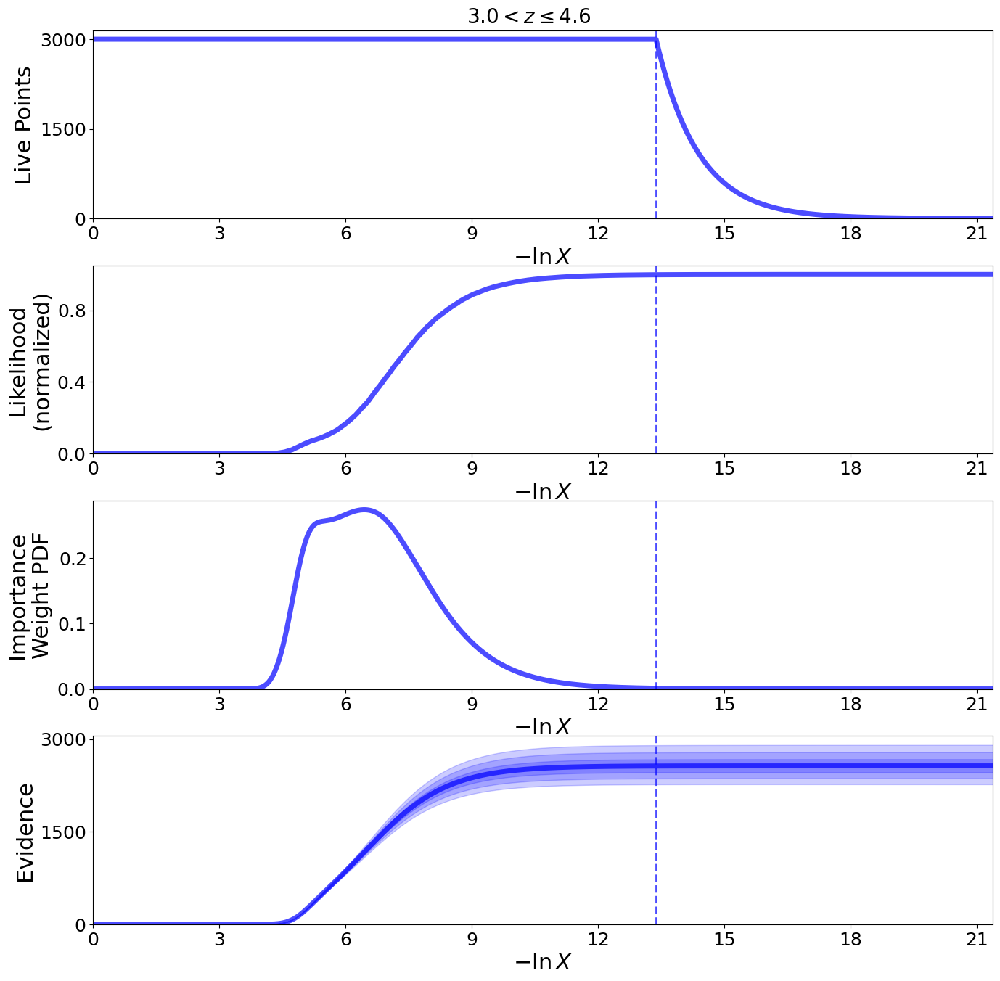

In [94]:
fig, axes = dyplot.runplot(results)  # summary (run) plot
fig.subplots_adjust(hspace=0.25)
fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.9)

<>:6: SyntaxWarning: invalid escape sequence '\l'
<>:6: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_94396/1024485889.py:6: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.95)


Text(0.5, 0.95, '$3.0<z \\leq4.6$')

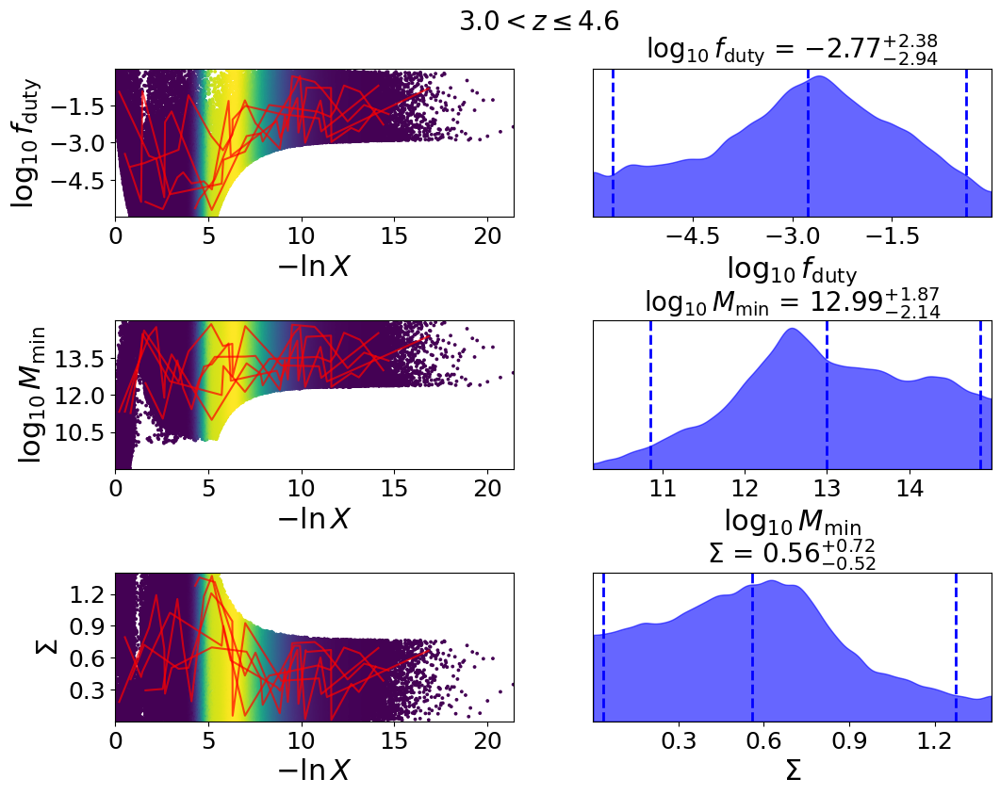

In [95]:
fig, axes = dyplot.traceplot(results, 
                             show_titles=True,
                             trace_cmap='viridis', connect=True,
                             connect_highlight=range(5), labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'])
fig.subplots_adjust(hspace=0.7)
fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.95)

<>:7: SyntaxWarning: invalid escape sequence '\l'
<>:7: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_94396/2270081726.py:7: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.975, x = 0.375)


Text(0.375, 0.975, '$3.0<z \\leq4.6$')

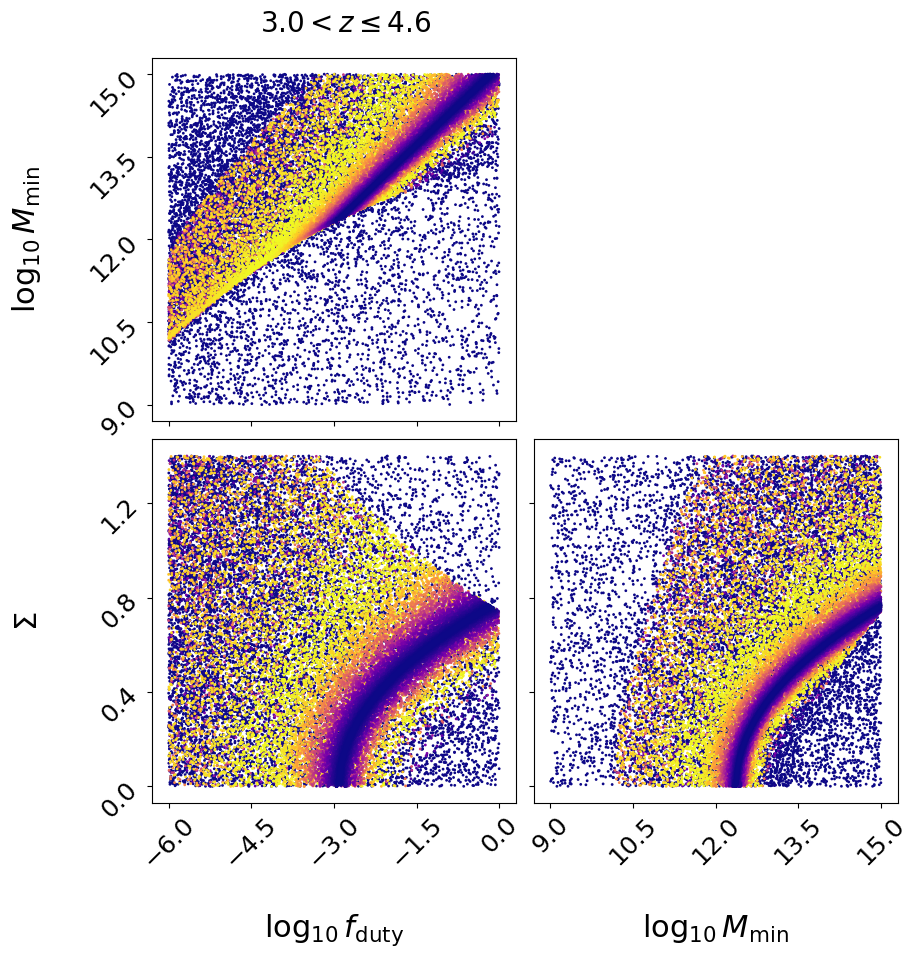

In [96]:
# initialize figure
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# plot initial run (res1; left)
fg, ax = dyplot.cornerpoints(results, cmap='plasma',
                             kde=True, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes))
fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.975, x = 0.375)

<>:8: SyntaxWarning: invalid escape sequence '\l'
<>:8: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_94396/2194410425.py:8: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 1, x = 0.25)


Text(0.25, 1, '$3.0<z \\leq4.6$')

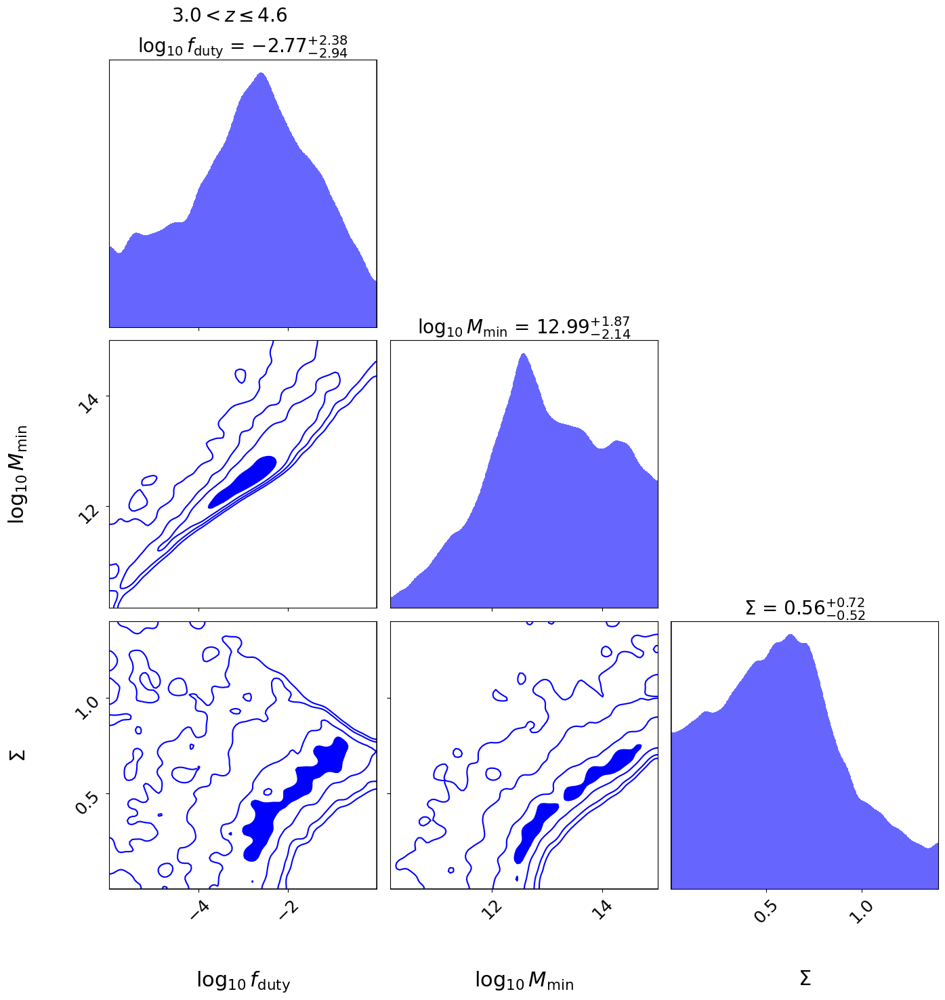

In [97]:
# # initialize figure
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# plot initial run (res1; left)
fg, ax = dyplot.cornerplot(results, color='blue', truths=np.zeros(ndim),
                           truth_color='black', show_titles=True,
                           max_n_ticks=3, quantiles=None, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes[:, :3]))
fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 1, x = 0.25)

<>:2: SyntaxWarning: invalid escape sequence '\m'
<>:3: SyntaxWarning: invalid escape sequence '\l'
<>:2: SyntaxWarning: invalid escape sequence '\m'
<>:3: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_94396/608613858.py:2: SyntaxWarning: invalid escape sequence '\m'
  plt.xlabel('$N_\mathrm{iter}$')
/tmp/ipykernel_94396/608613858.py:3: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log(z) uncertainty$')


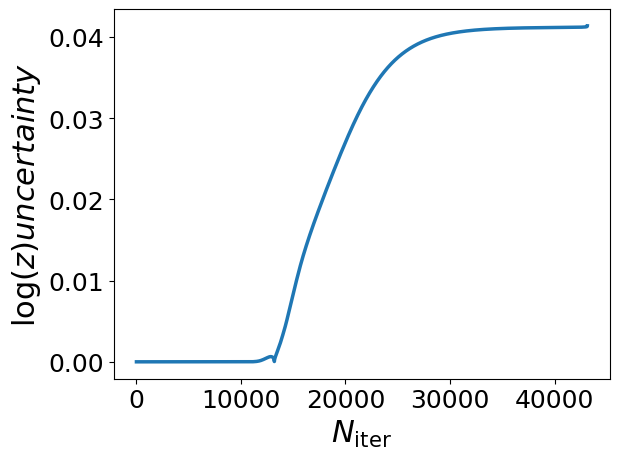

In [98]:
plt.plot(results.logzerr, linewidth = 2.5)
plt.xlabel('$N_\mathrm{iter}$')
plt.ylabel('$\log(z) uncertainty$')
plt.show()

In [99]:
samples, weights = results.samples, results.importance_weights()
mean, cov = dyfunc.mean_and_cov(samples, weights)
print(mean, cov)

[-2.87578596 13.03484002  0.56980266] [[ 2.03665760e+00  1.28680094e+00 -1.11885593e-03]
 [ 1.28680094e+00  1.18439705e+00  1.86514061e-01]
 [-1.11885593e-03  1.86514061e-01  1.07084000e-01]]


In [100]:
# Compute weighted quantiles
samples, weights = results.samples, results.importance_weights()

# Get median and 1-sigma (16th, 50th, 84th percentiles) for each parameter
quantiles = [dyfunc.quantile(samples[:, i], [0.025, 0.5, 0.975], weights=weights) 
             for i in range(samples.shape[1])]
labels = ['log10(f_duty)', 'log10(M_min)', 'sigma']

for i, (lo, mid, hi) in enumerate(quantiles):
    print(f"{labels[i]}: {mid:.2f} + {hi-mid:.2f}/-{mid-lo:.2f}")

log10(f_duty): -2.77 + 2.38/-2.94
log10(M_min): 12.99 + 1.87/-2.14
sigma: 0.56 + 0.72/-0.52


In [101]:
weights = np.exp(results.logwt - results.logz[-1])
ESS = 1.0 / np.sum(weights**2)
print(f"Effective samples: {ESS:.0f}")
# You want this >> 100, ideally 1000+

Effective samples: 14206


## Convergence criterion

<>:50: SyntaxWarning: invalid escape sequence '\s'
<>:51: SyntaxWarning: invalid escape sequence '\l'
<>:50: SyntaxWarning: invalid escape sequence '\s'
<>:51: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_205391/2118712634.py:50: SyntaxWarning: invalid escape sequence '\s'
  plt.fill_between(range(len(seeds)), mean-std, mean+std, alpha = 0.5, label = '$1\sigma')
/tmp/ipykernel_205391/2118712634.py:51: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log(z)$')


0.0<z<=1.0


42266it [02:43, 259.00it/s, +3000 | bound: 44 | nc: 1 | ncall: 241271 | eff(%): 18.998 | loglstar:   -inf < 35.689 <    inf | logz: 28.511 +/-  0.045 | dlogz:  0.000 >  0.001]   


seed=44: logZ = 28.511 ± 0.045


42311it [02:56, 239.24it/s, +3000 | bound: 49 | nc: 1 | ncall: 257733 | eff(%): 17.788 | loglstar:   -inf < 35.689 <    inf | logz: 28.497 +/-  0.045 | dlogz:  0.000 >  0.001]   


seed=520: logZ = 28.497 ± 0.045


42223it [02:55, 240.90it/s, +3000 | bound: 48 | nc: 1 | ncall: 252339 | eff(%): 18.137 | loglstar:   -inf < 35.689 <    inf | logz: 28.526 +/-  0.045 | dlogz:  0.000 >  0.001]   


seed=619: logZ = 28.526 ± 0.045


42377it [02:51, 247.04it/s, +3000 | bound: 46 | nc: 1 | ncall: 243997 | eff(%): 18.829 | loglstar:   -inf < 35.689 <    inf | logz: 28.474 +/-  0.045 | dlogz:  0.000 >  0.001]   


seed=892: logZ = 28.474 ± 0.045


42037it [03:11, 219.51it/s, +3000 | bound: 48 | nc: 1 | ncall: 251142 | eff(%): 18.150 | loglstar:   -inf < 35.689 <    inf | logz: 28.588 +/-  0.045 | dlogz:  0.000 >  0.001]   


seed=142: logZ = 28.588 ± 0.045

Mean logZ: 28.519
Std logZ:  0.038


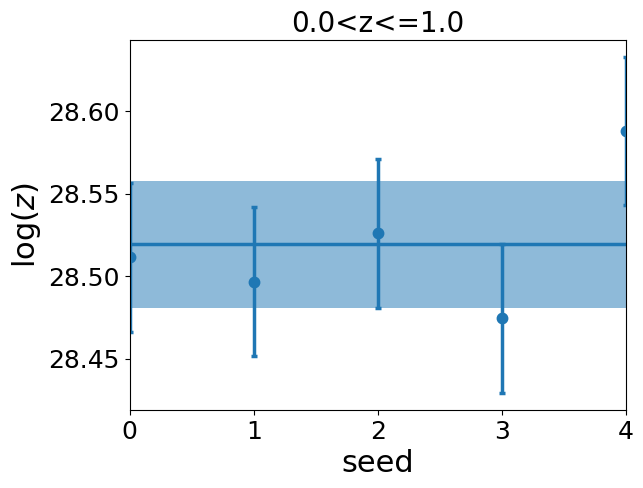

1.0<z<=2.0


44251it [03:03, 241.63it/s, +3000 | bound: 49 | nc: 1 | ncall: 254447 | eff(%): 18.792 | loglstar:   -inf < 45.209 <    inf | logz: 37.369 +/-  0.048 | dlogz:  0.000 >  0.001]   


seed=44: logZ = 37.369 ± 0.048


44364it [03:11, 231.15it/s, +3000 | bound: 54 | nc: 1 | ncall: 270334 | eff(%): 17.717 | loglstar:   -inf < 45.209 <    inf | logz: 37.332 +/-  0.048 | dlogz:  0.000 >  0.001]   


seed=520: logZ = 37.332 ± 0.048


44651it [03:05, 240.77it/s, +3000 | bound: 52 | nc: 1 | ncall: 268010 | eff(%): 17.981 | loglstar:   -inf < 45.209 <    inf | logz: 37.236 +/-  0.048 | dlogz:  0.000 >  0.001]   


seed=619: logZ = 37.236 ± 0.048


44684it [03:08, 236.54it/s, +3000 | bound: 54 | nc: 1 | ncall: 271572 | eff(%): 17.755 | loglstar:   -inf < 45.209 <    inf | logz: 37.225 +/-  0.048 | dlogz:  0.000 >  0.001]   


seed=892: logZ = 37.225 ± 0.048


44251it [02:55, 251.91it/s, +3000 | bound: 49 | nc: 1 | ncall: 254573 | eff(%): 18.782 | loglstar:   -inf < 45.209 <    inf | logz: 37.369 +/-  0.048 | dlogz:  0.000 >  0.001]   


seed=142: logZ = 37.369 ± 0.048

Mean logZ: 37.306
Std logZ:  0.063


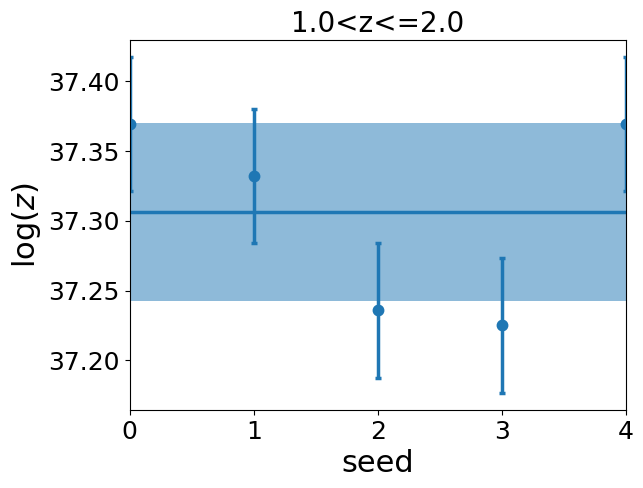

2.0<z<=3.0


44239it [03:24, 216.71it/s, +3000 | bound: 59 | nc: 1 | ncall: 288680 | eff(%): 16.536 | loglstar:   -inf < 36.644 <    inf | logz: 28.808 +/-  0.047 | dlogz:  0.000 >  0.001]   


seed=44: logZ = 28.808 ± 0.048


44148it [03:24, 215.69it/s, +3000 | bound: 59 | nc: 1 | ncall: 288692 | eff(%): 16.503 | loglstar:   -inf < 36.644 <    inf | logz: 28.839 +/-  0.047 | dlogz:  0.000 >  0.001]   


seed=520: logZ = 28.839 ± 0.048


44228it [03:23, 217.71it/s, +3000 | bound: 59 | nc: 1 | ncall: 288442 | eff(%): 16.546 | loglstar:   -inf < 36.644 <    inf | logz: 28.812 +/-  0.048 | dlogz:  0.000 >  0.001]   


seed=619: logZ = 28.812 ± 0.048


43861it [03:14, 225.68it/s, +3000 | bound: 56 | nc: 1 | ncall: 275636 | eff(%): 17.188 | loglstar:   -inf < 36.644 <    inf | logz: 28.934 +/-  0.047 | dlogz:  0.000 >  0.001]   


seed=892: logZ = 28.934 ± 0.047


43863it [03:26, 212.41it/s, +3000 | bound: 60 | nc: 1 | ncall: 287130 | eff(%): 16.494 | loglstar:   -inf < 36.644 <    inf | logz: 28.934 +/-  0.047 | dlogz:  0.000 >  0.001]   


seed=142: logZ = 28.934 ± 0.047

Mean logZ: 28.866
Std logZ:  0.057


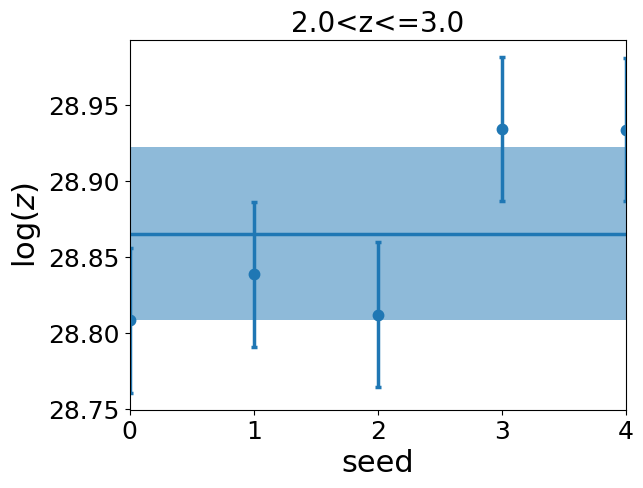

3.0<z<=4.6


38162it [03:20, 38.22it/s, bound: 57 | nc: 53 | ncall: 280599 | eff(%): 13.600 | loglstar:   -inf < 14.316 <    inf | logz:  7.807 +/-  0.034 | dlogz:  0.002 >  0.001]           /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
38373it [03:33, 36.42it/s, bound: 62 | nc: 2 | ncall: 296035 | eff(%): 12.962 | loglstar:   -inf < 14.316 <    inf | logz:  7.807 +/-  0.034 | dlogz:  0.002 >  0.001]  /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined fr

seed=44: logZ = 7.809 ± 0.042


40172it [04:03, 164.77it/s, +3000 | bound: 75 | nc: 1 | ncall: 334151 | eff(%): 13.037 | loglstar:   -inf < 14.319 <    inf | logz:  7.840 +/-  0.040 | dlogz:  0.000 >  0.001]   


seed=520: logZ = 7.840 ± 0.041


40121it [04:20, 52.62it/s, bound: 82 | nc: 26 | ncall: 355954 | eff(%): 11.271 | loglstar:   -inf < 14.318 <    inf | logz:  7.777 +/-  0.046 | dlogz:  0.001 >  0.001]           /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
40343it [04:26, 111.62it/s, bound: 84 | nc: 16 | ncall: 362405 | eff(%): 11.132 | loglstar:   -inf < 14.318 <    inf | logz:  7.777 +/-  0.046 | dlogz:  0.001 >  0.001]/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined fr

seed=619: logZ = 7.778 ± 0.042


40387it [04:02, 166.65it/s, +3000 | bound: 74 | nc: 1 | ncall: 334502 | eff(%): 13.088 | loglstar:   -inf < 14.319 <    inf | logz:  7.768 +/-  0.037 | dlogz:  0.000 >  0.001]   


seed=892: logZ = 7.768 ± 0.042


37949it [03:51, 50.53it/s, bound: 71 | nc: 104 | ncall: 320868 | eff(%): 11.827 | loglstar:   -inf < 14.316 <    inf | logz:  7.846 +/-  0.039 | dlogz:  0.002 >  0.001]          /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
40145it [04:16, 156.77it/s, +3000 | bound: 81 | nc: 1 | ncall: 352875 | eff(%): 12.332 | loglstar:   -inf < 14.319 <    inf | logz:  7.848 +/-  0.039 | dlogz:  0.000 >  0.001]


seed=142: logZ = 7.848 ± 0.041

Mean logZ: 7.809
Std logZ:  0.032


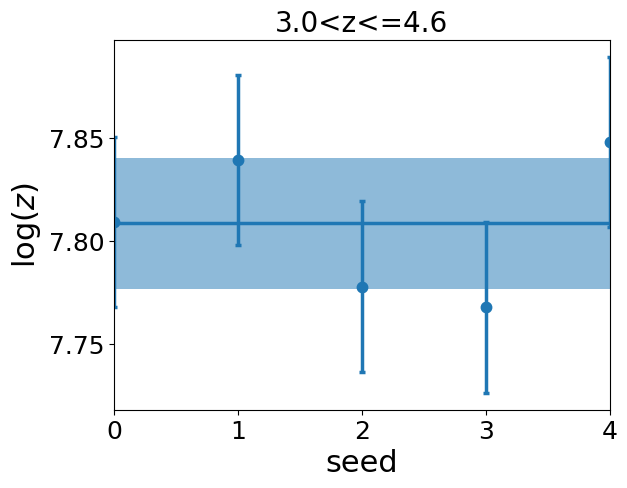

In [64]:
seeds = np.random.choice(range(1000), size=5, replace = False)

for j in z_array:

    print('{:.1f}<z<={:.1f}'.format(z_bins[j], z_bins[j+1]))

    results_list = []
    logz_values = []
    logz_err = []
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
    ix_grid = np.ix_(rpmask, rpmask)

    # check if cov is hermitian and positive definite
    if linalg.ishermitian(C) and np.all(np.linalg.eigvals(C) > 0):
        C_factor = linalg.cho_factor(C[ix_grid])
        log_det_C = 2 * np.sum(np.log(np.diag(C_factor[0])))
        solve = lambda rhs: linalg.cho_solve(C_factor, rhs)
    else:
        print('using LU decomposition')
        C_factor = linalg.lu_factor(C[ix_grid])
        log_det_C = np.sum(np.log(np.abs(np.diag(C_factor[0])))) # does abs value make sense
        solve = lambda rhs: linalg.lu_solve(C_factor, rhs)
            
    for seed in seeds:
            
        # initialize our nested sampler
        sampler = NestedSampler(loglike, ptform, ndim, logl_args=[a_zbin[j], cf_matter_chi2[j][rpmask], log_det_C, cf_chi2[j][rpmask], n_q[j], nbins], nlive = nlive, rstate=np.random.default_rng(seed))
        
        # run the sampler with checkpointing
        sampler.run_nested(dlogz = dlogz)
        results = sampler.results

        logz = results.logz[-1]
        logzerr = results.logzerr[-1]
        logz_values.append(logz)
        logz_err.append(logzerr)
        results_list.append(sampler.results)
        print(f"seed={seed}: logZ = {logz:.3f} ± {logzerr:.3f}")

    # Summary statistics
    mean = np.mean(logz_values)
    std = np.std(logz_values)

    print(f"\nMean logZ: {mean:.3f}")
    print(f"Std logZ:  {std:.3f}")

    plt.errorbar(range(len(seeds)), logz_values, yerr = logz_err,  marker = 'o', markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none', label = 'per seed', linewidth = 2.5)
    plt.axhline(mean, linewidth = 2.5, label = 'mean')
    plt.fill_between(range(len(seeds)), mean-std, mean+std, alpha = 0.5, label = '$1\sigma')
    plt.ylabel('$\log(z)$')
    plt.xlabel('seed')
    plt.title('{:.1f}<z<={:.1f}'.format(z_bins[j], z_bins[j+1]))
    # plt.legend()
    plt.xlim(0, len(seeds)-1)
    plt.show()

## Across all $z$

<>:35: SyntaxWarning: invalid escape sequence '\l'
<>:42: SyntaxWarning: invalid escape sequence '\l'
<>:50: SyntaxWarning: invalid escape sequence '\l'
<>:59: SyntaxWarning: invalid escape sequence '\l'
<>:35: SyntaxWarning: invalid escape sequence '\l'
<>:42: SyntaxWarning: invalid escape sequence '\l'
<>:50: SyntaxWarning: invalid escape sequence '\l'
<>:59: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_94396/575119409.py:35: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.9)
/tmp/ipykernel_94396/575119409.py:42: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.95)
/tmp/ipykernel_94396/575119409.py:50: SyntaxWarning: invalid escape sequence '\l'
  fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.975, x = 0.375)
/tmp/ipykernel_94396/575119409.py:59: SyntaxWar

Summary
nlive: 3000
niter: 42418
ncall: 256059
eff(%): 17.737
logz: 28.461 +/-  0.045
0<z<=1
log10(f_duty): -2.39 + 0.63/-0.40
log10(M_min): 12.88 + 1.37/-0.79
sigma: 0.69 + 0.38/-0.46



44655it [05:31, 134.78it/s, +3000 | bound: 54 | nc: 1 | ncall: 273520 | eff(%): 17.616 | loglstar:   -inf < 45.209 <    inf | logz: 37.235 +/-  0.048 | dlogz:  0.000 >  0.001]  


Summary
nlive: 3000
niter: 44655
ncall: 270520
eff(%): 17.616
logz: 37.235 +/-  0.048
1<z<=2
log10(f_duty): -2.30 + 0.77/-0.46
log10(M_min): 12.96 + 1.33/-0.84
sigma: 0.64 + 0.33/-0.42



44263it [05:58, 123.58it/s, +3000 | bound: 58 | nc: 1 | ncall: 282669 | eff(%): 16.900 | loglstar:   -inf < 36.644 <    inf | logz: 28.801 +/-  0.048 | dlogz:  0.000 >  0.001]  


Summary
nlive: 3000
niter: 44263
ncall: 279669
eff(%): 16.900
logz: 28.801 +/-  0.048
2<z<=3
log10(f_duty): -2.15 + 0.94/-0.63
log10(M_min): 13.08 + 1.31/-0.87
sigma: 0.58 + 0.29/-0.37



38809it [07:17, 17.93it/s, bound: 75 | nc: 150 | ncall: 333675 | eff(%): 11.631 | loglstar:   -inf < 14.317 <    inf | logz:  7.817 +/-  0.043 | dlogz:  0.002 >  0.001]         /home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined from bootstrapping is very large. If you are using uniform sampling that may mean that the sampling will be inefficient. This may be caused by a very complex posterior shape. You may consider using more livepoints or different sampler (i.e. rslice or rwalk) or alternatively disable bootstrap (bootstrap=0)
  warnings.warn(
38829it [07:21,  5.90it/s, bound: 76 | nc: 464 | ncall: 336576 | eff(%): 11.536 | loglstar:   -inf < 14.317 <    inf | logz:  7.817 +/-  0.043 | dlogz:  0.002 >  0.001]/home/groups/tabel/mahlet/pyccl-env/lib/python3.12/site-packages/dynesty/bounding.py:707: UserWarning: The enlargement factor for the ellipsoidal bounds determined fro

Summary
nlive: 3000
niter: 40235
ncall: 355514
eff(%): 12.161
logz:  7.819 +/-  0.041
3<z<=4
log10(f_duty): -2.80 + 1.42/-1.63
log10(M_min): 13.00 + 1.30/-1.03
sigma: 0.57 + 0.34/-0.35



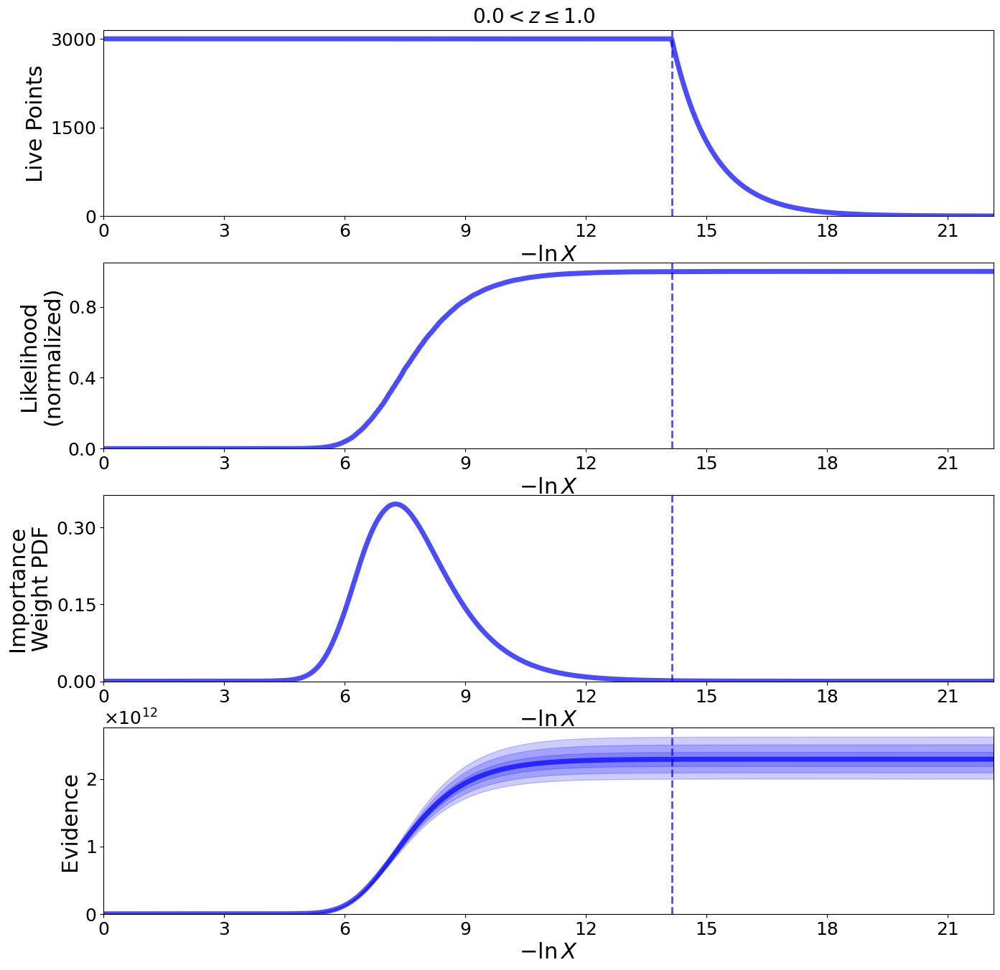

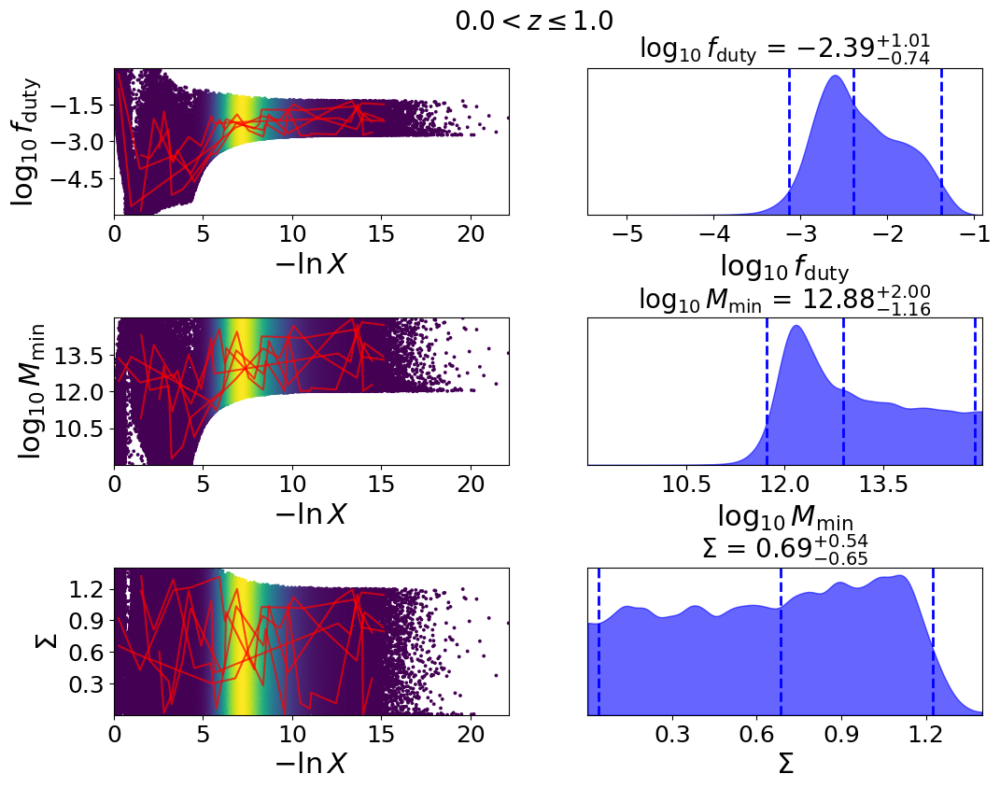

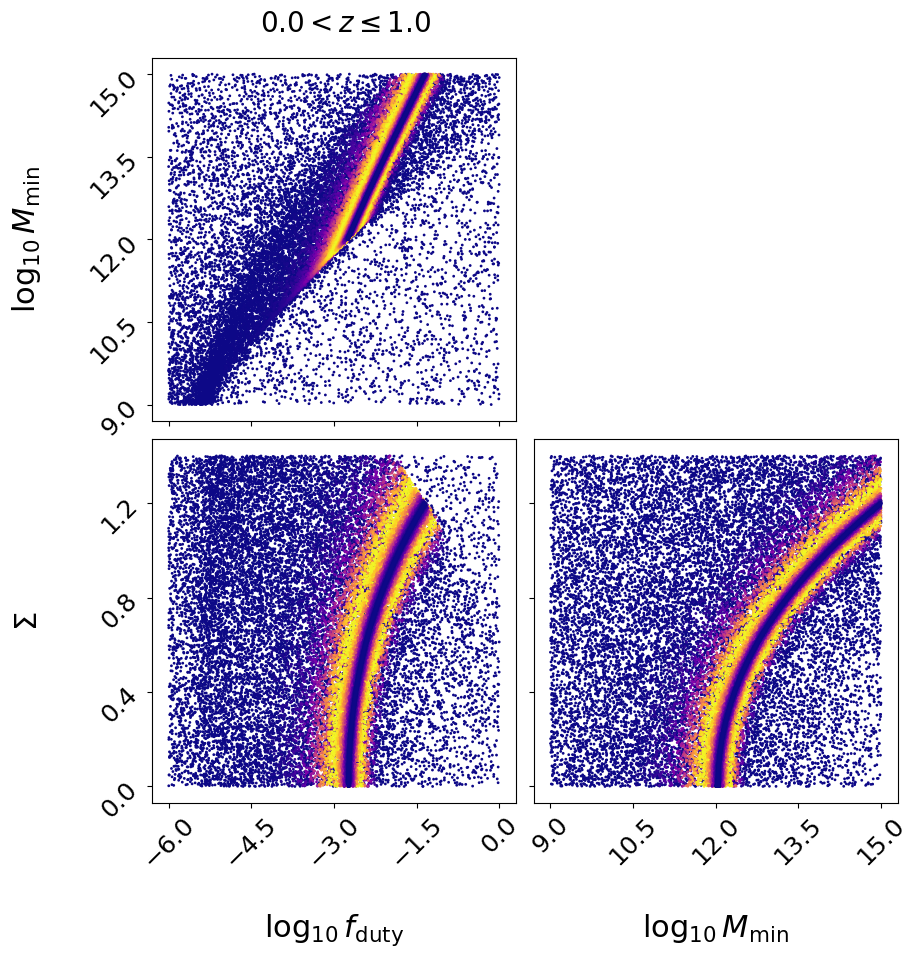

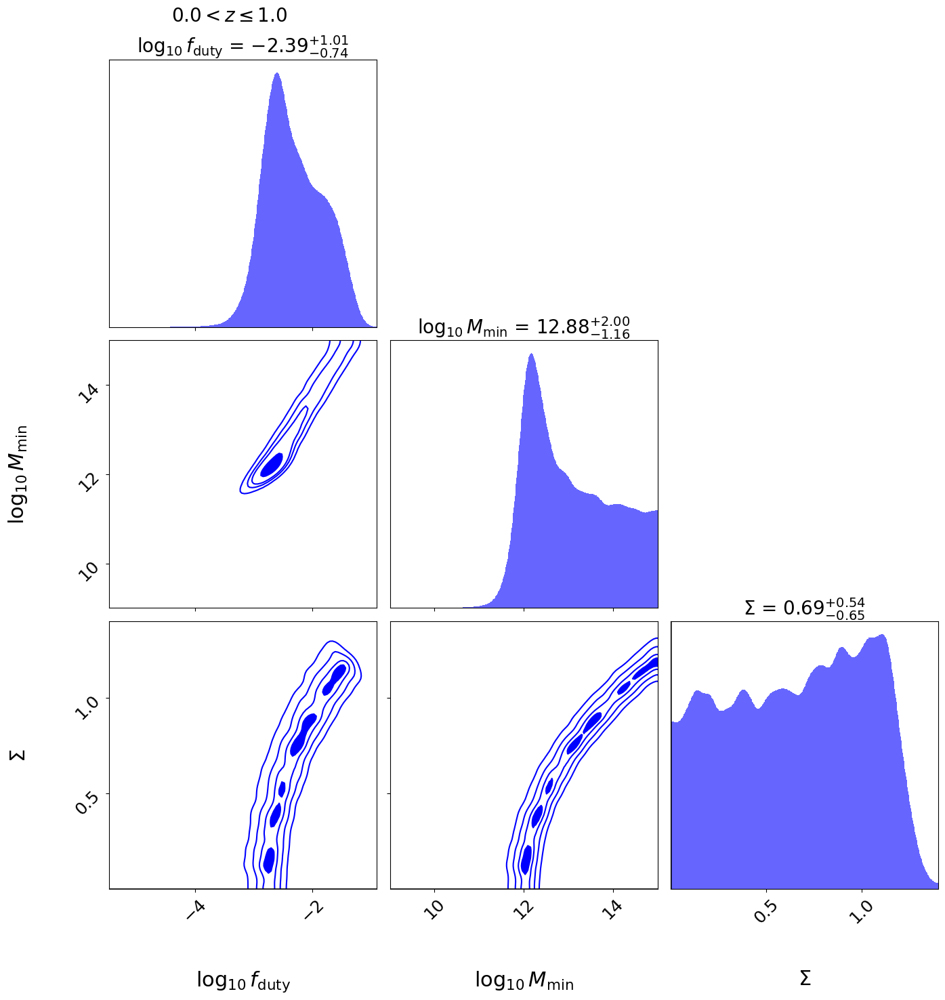

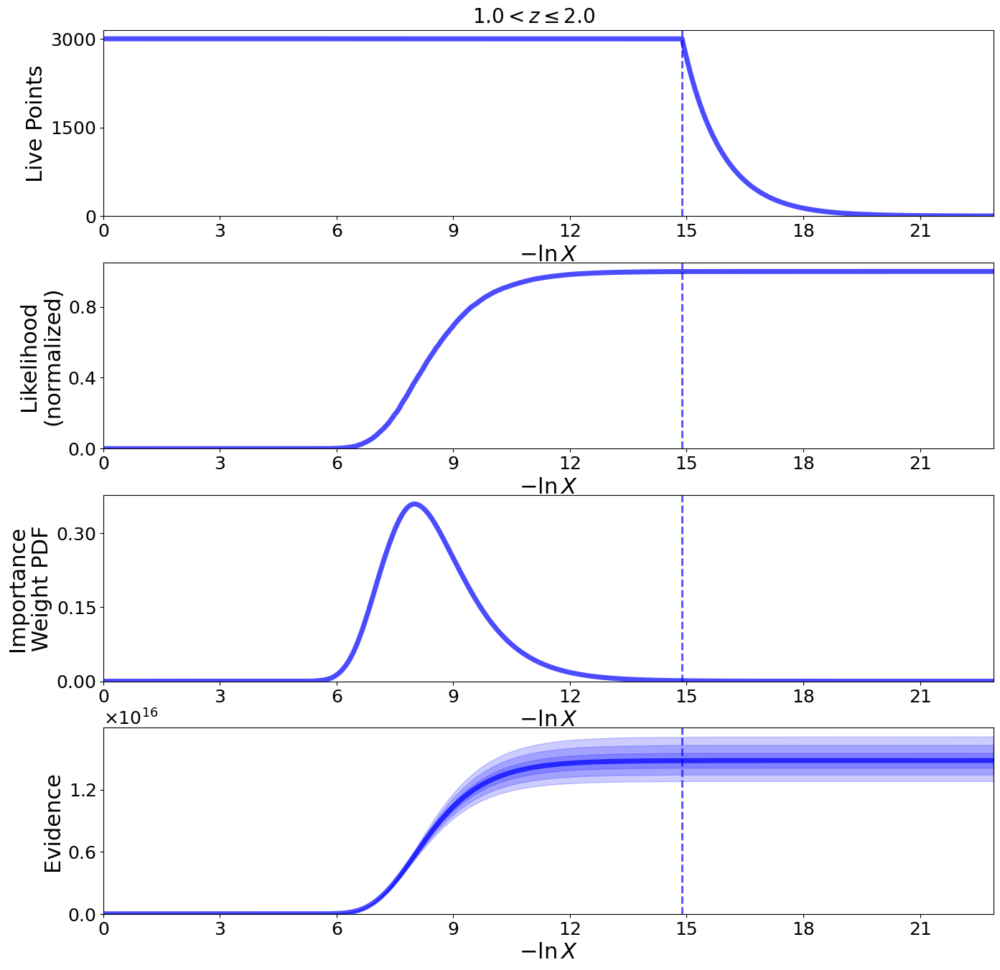

...

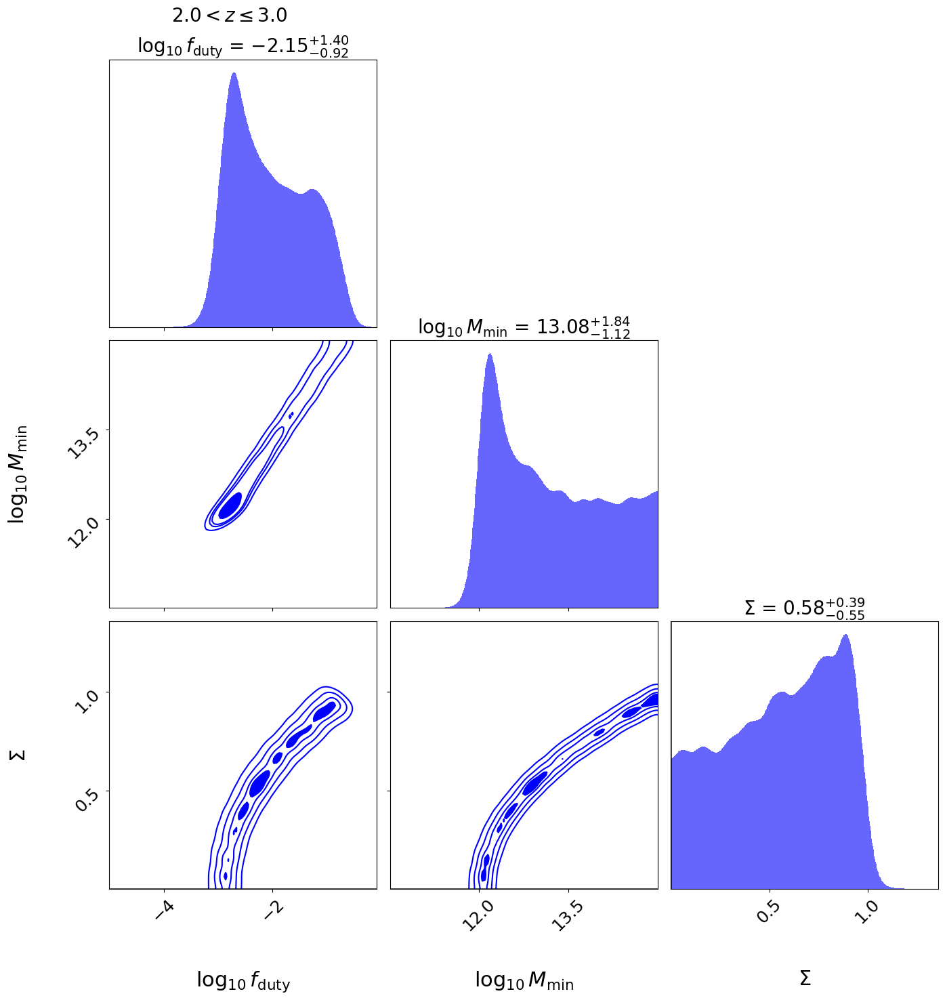

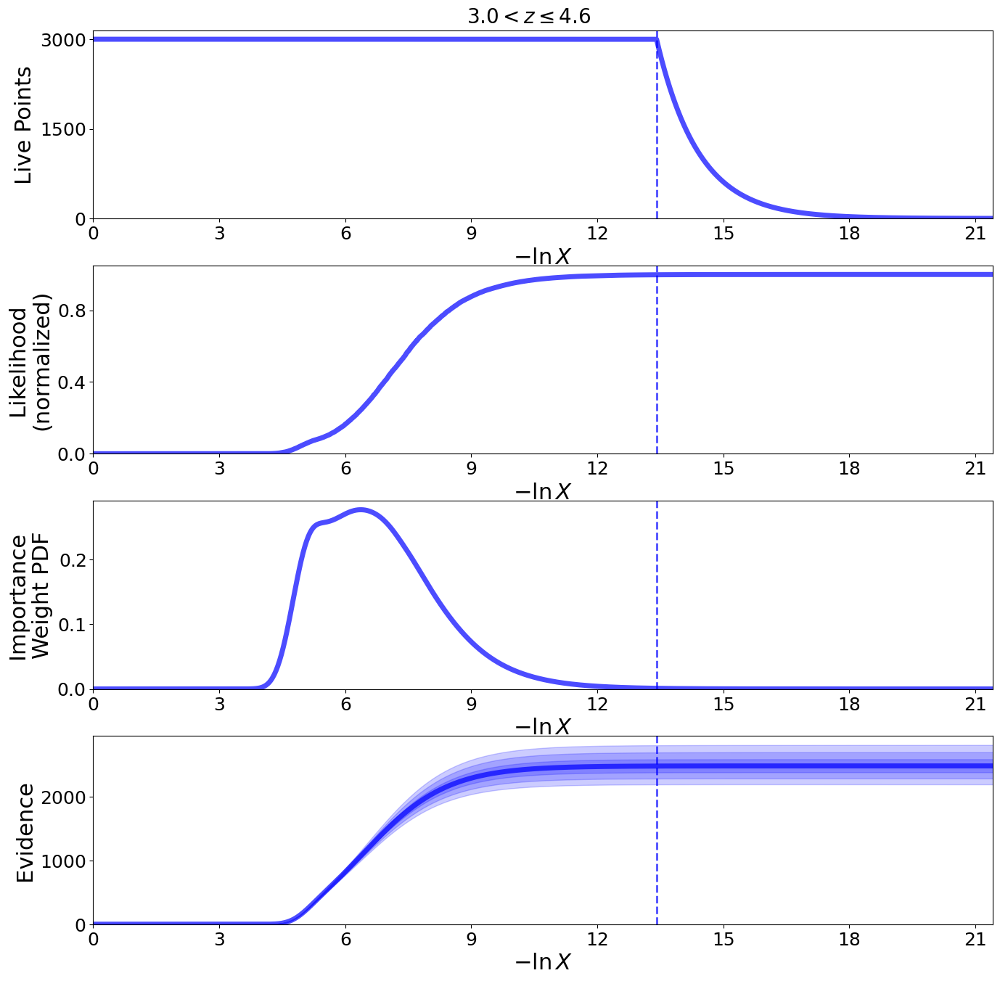

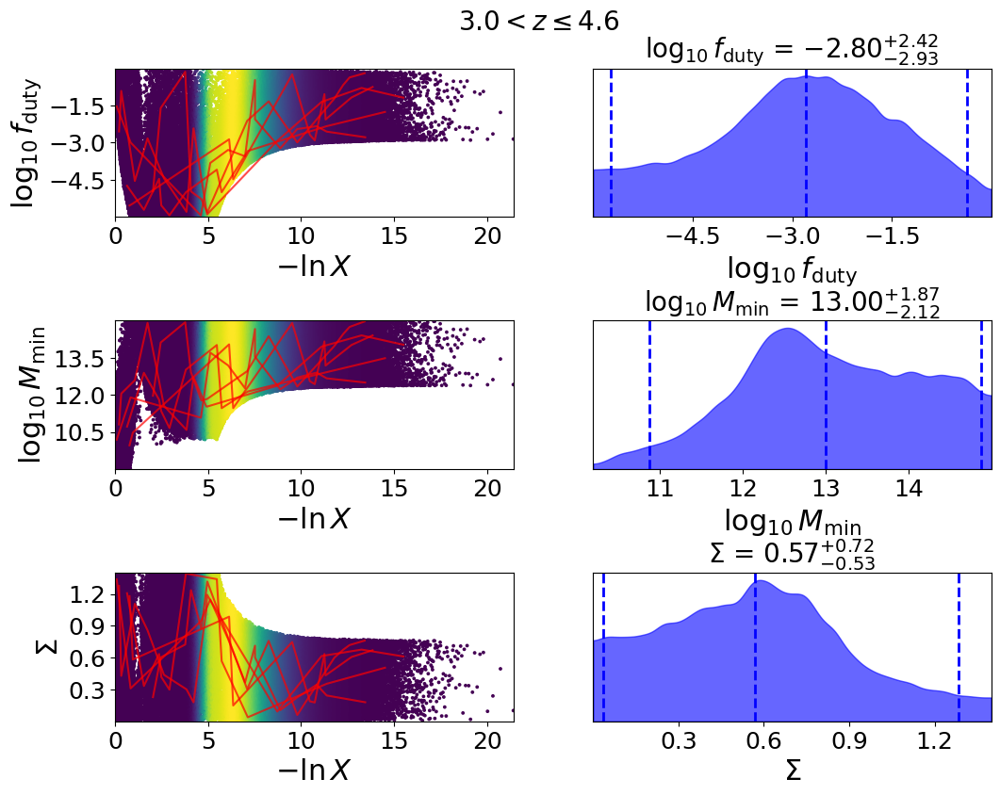

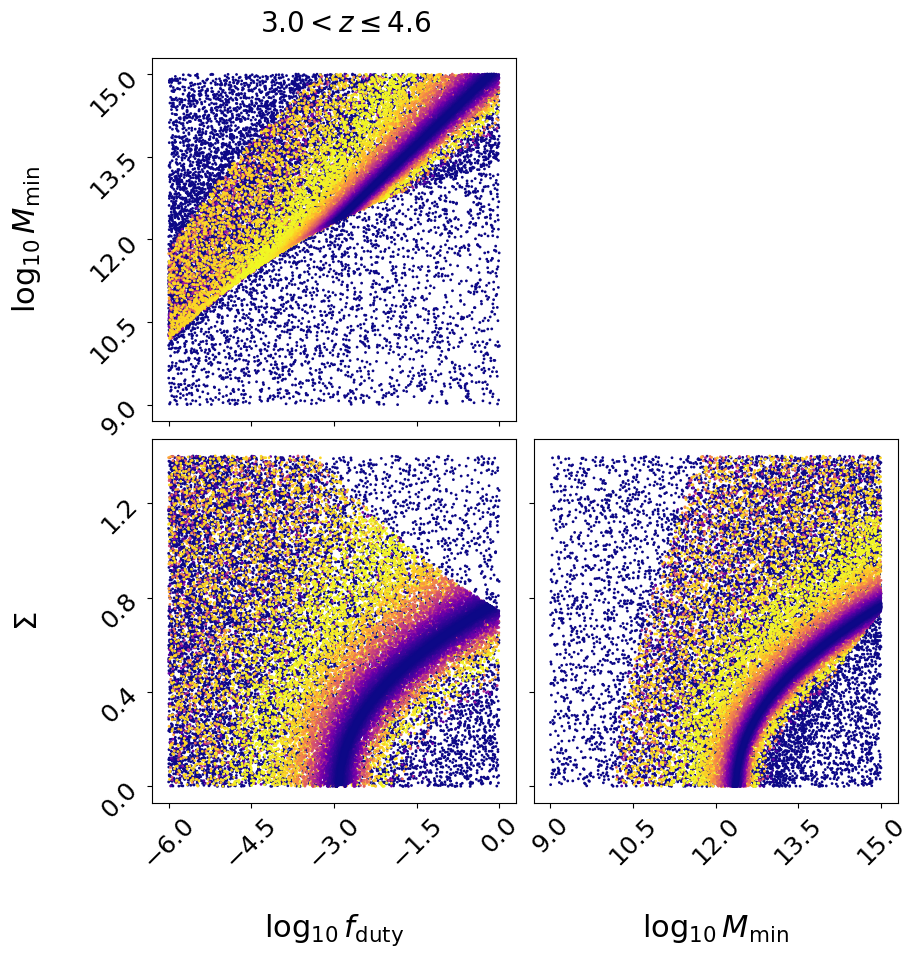

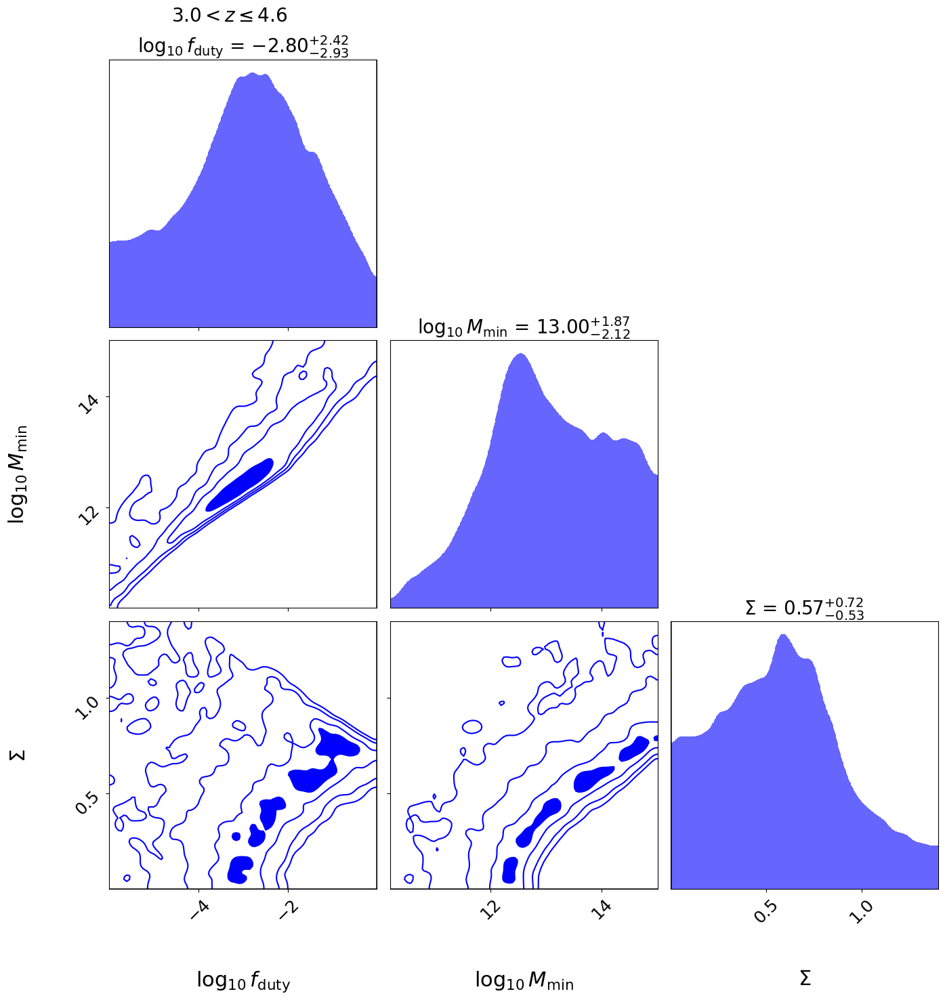

In [102]:
f_duty, M_min, sigma = [], [], []
labels = ['log10(f_duty)', 'log10(M_min)', 'sigma']
err = {i: [] for i in labels}
f_duty_samples, M_min_samples, sigma_samples = [], [], []
best_fit_params = []
logz = []
for j in z_array:

    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
    ix_grid = np.ix_(rpmask, rpmask)

    # check if cov is hermitian and positive definite
    if linalg.ishermitian(C) and np.all(np.linalg.eigvals(C) > 0):
        C_factor = linalg.cho_factor(C[ix_grid])
        log_det_C = 2 * np.sum(np.log(np.diag(C_factor[0])))
        solve = lambda rhs: linalg.cho_solve(C_factor, rhs)
    else:
        print('using LU decomposition')
        C_factor = linalg.lu_factor(C[ix_grid])
        log_det_C = np.sum(np.log(np.abs(np.diag(C_factor[0])))) # does abs value make sense
        solve = lambda rhs: linalg.lu_solve(C_factor, rhs)
        
    # initialize our nested sampler
    sampler = NestedSampler(loglike, ptform, ndim, logl_args=[a_zbin[j], cf_matter_chi2[j][rpmask], log_det_C, cf_chi2[j][rpmask], n_q[j], nbins], nlive = nlive)
    
    # run the sampler with checkpointing
    sampler.run_nested(dlogz = dlogz)
    results = sampler.results
    
    # Print out a summary of the results.
    results.summary()
    
    fig, axes = dyplot.runplot(results)  # summary (run) plot
    fig.subplots_adjust(hspace=0.25)
    fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.9)
    
    fig, axes = dyplot.traceplot(results, 
                                 show_titles=True,
                                 trace_cmap='viridis', connect=True,
                                 connect_highlight=range(5), labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'])
    fig.subplots_adjust(hspace=0.7)
    fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.95)
    
    # initialize figure
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    # plot initial run (res1; left)
    fg, ax = dyplot.cornerpoints(results, cmap='plasma',
                                 kde=False, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes))
    fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 0.975, x = 0.375)
    
    ## # initialize figure
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))

    # plot initial run (res1; left)
    fg, ax = dyplot.cornerplot(results, color='blue', truths=np.zeros(ndim),
                               truth_color='black', show_titles=True,
                               max_n_ticks=3, quantiles=None, labels=[r'$\log_{10}f_\mathrm{duty}$', r'$\log_{10} M_\mathrm{min}$', r'$\Sigma$'], fig=(fig, axes[:, :3]))
    fig.suptitle('${:.1f}<z \leq{:.1f}$'.format(z_bins[j], z_bins[j+1]), fontsize = 20, y = 1, x = 0.25)

    samples, weights = results.samples, results.importance_weights()

    # Get median and 1-sigma (16th, 50th, 84th percentiles) for each parameter
    quantiles = [dyfunc.quantile(samples[:, i], [0.16, 0.5, 0.84], weights=weights) 
                 for i in range(samples.shape[1])]

    print('{}<z<={}'.format(j, j+1))
    for k, (lo, mid, hi) in enumerate(quantiles):
        print(f"{labels[k]}: {mid:.2f} + {hi-mid:.2f}/-{mid-lo:.2f}")
        err[labels[k]].append((lo, hi))
    print()
    
    equal_weight_samples = dyfunc.resample_equal(samples, weights)
    ind = np.random.choice(range(len(equal_weight_samples)), size = 1000, replace = False)
    f_duty_samples.append(equal_weight_samples[ind][:,0])
    M_min_samples.append(equal_weight_samples[ind][:,1])
    sigma_samples.append(equal_weight_samples[ind][:,2])
    
    f_duty.append(quantiles[0][1])
    M_min.append(quantiles[1][1]) 
    sigma.append(quantiles[2][1]) 

    # Get the maximum likelihood sample from dynesty results
    idx_max = np.argmax(results.logl)
    best_fit_params.append(samples[idx_max])
    logz.append(results.logz[-1])

### Solve for $\chi_c^2=\Delta^T x$ where $Cx=\Delta$

In [103]:
def f0_GLS_solve(x, a, cf_matter, C, cf, cosmo = cosmo_planck18, bins_m = bins, hartlap = hartlap): #M_max = M_max):  #quaia):
    
    fduty, M_min, sigma = x
    n_m=HOD_scatter(10**fduty, M_min, bins_m, sigma)
        
    cf_2h_zbin, _ = cf_2h(bins_m, n_m, a, cosmo, cf_matter, recenter = False)
    delta = cf-cf_2h_zbin
        
    return delta.T @ (hartlap*np.linalg.solve(C, delta))

### Add a number density constraint

In [104]:
def constraint(x, a, n_q, cosmo = cosmo_planck18, error = 0.05, bins_m = bins):
    
    fduty, M_min, sigma = x
    n_m=HOD_scatter(10**fduty, M_min, bins_m, sigma)
    
    n_q_theory = M(bins_m, n_m, a = a, cosmo = cosmo, recenter = False)[1]

    return error-np.abs(n_q_theory-n_q)/n_q

In [105]:
for j in z_array:
    
    print('{:.1f}<z<={:.1f}'.format(z_bins[j], z_bins[j+1]))
    x = f_duty[j], M_min[j], sigma[j]
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo)) # good
    # chi2 = f0_GLS_solve(x, a_zbin[j], cf_matter_chi2[j], C, cf_chi2[j])
    chi2 = f0_GLS_solve(best_fit_params[j], a_zbin[j], cf_matter_chi2[j], C, cf_chi2[j])
    df = nbins-len(x)

    print('           chi^2: {:.2f}'.format(chi2))
    print('   reduced chi^2: {:.2f}'.format(chi2/df))
    print('         delta n: {:.2e}'.format(constraint(x, a_zbin[j], n_q[j])))
    print('condition number: {:.2f}'.format(np.linalg.cond(C)))
    print('             PTE: {:.2f}\n'.format(stats.chi2.sf(chi2, df)))

0.0<z<=1.0
           chi^2: 30.35
   reduced chi^2: 4.34
         delta n: 2.22e-02
condition number: 14.67
             PTE: 0.00

1.0<z<=2.0
           chi^2: 12.22
   reduced chi^2: 1.75
         delta n: 4.21e-02
condition number: 13.55
             PTE: 0.09

2.0<z<=3.0
           chi^2: 15.13
   reduced chi^2: 2.16
         delta n: 3.94e-02
condition number: 11.13
             PTE: 0.03

3.0<z<=4.6
           chi^2: 21.64
   reduced chi^2: 3.09
         delta n: -1.58e-01
condition number: 12.29
             PTE: 0.00



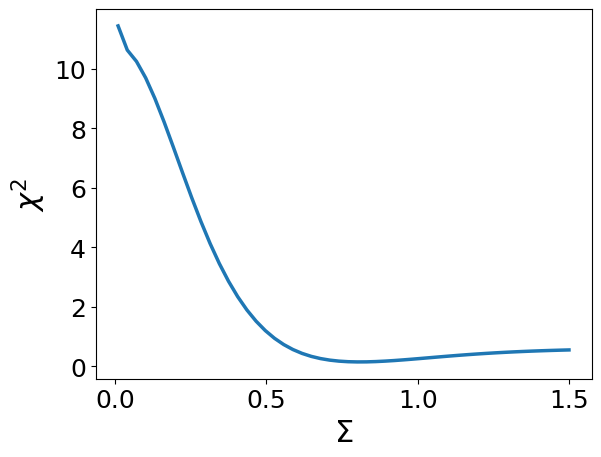

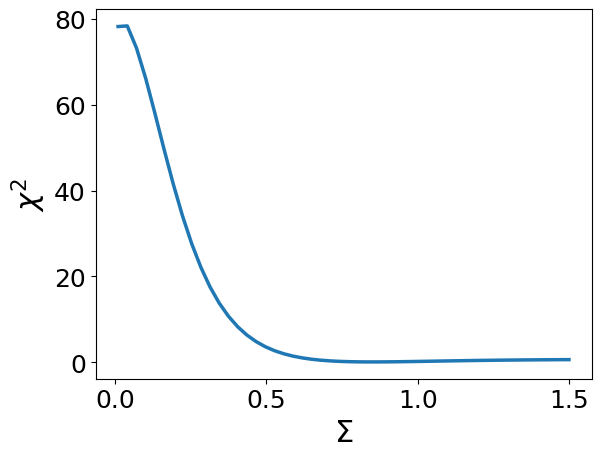

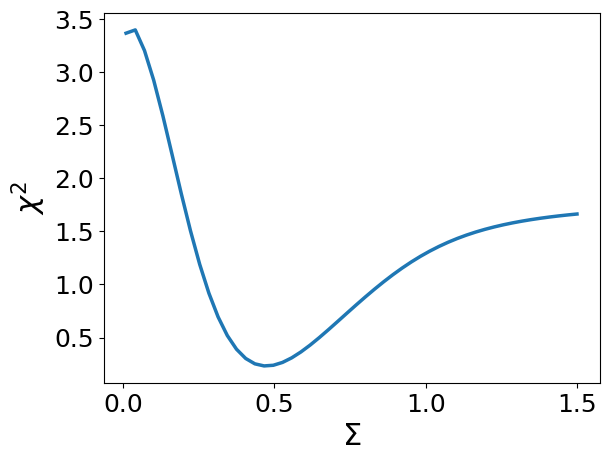

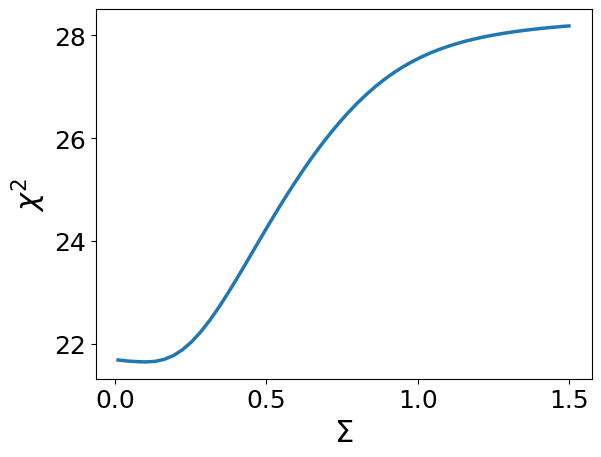

In [106]:
# Scan chi2 as a function of Sigma at fixed best-fit Mmin, fduty
sigmas = np.linspace(0.01, 1.5, 50)
for j in z_array:
    chi2_sigma = []
    for s in sigmas:
        params = [best_fit_params[j][0], best_fit_params[j][1], s]
        chi2_sigma.append(f0_GLS_solve(params, a_zbin[j], cf_matter_chi2[j], C, cf_chi2[j]))
    
    plt.plot(sigmas, chi2_sigma, linewidth = 2.5)
    plt.xlabel(r'$\Sigma$')
    plt.ylabel(r'$\chi^2$')
    plt.show()

In [107]:
best_fit_params

[array([-2.04525039, 13.56176288,  0.87389544]),
 array([-1.79190449, 13.81970886,  0.86855432]),
 array([-2.35120091, 12.76674182,  0.47894597]),
 array([-2.85543763, 12.41626698,  0.10100454])]

In [108]:
logz_step = np.load('../results/logz_xi.npy')

for j in z_array:
    
    print(np.exp(logz[j]-logz_step[j]))

1.0100763823346972
0.9871481550463896
0.9384134686112727
1.0049908624504091


## Check residual

In [66]:
best_fit_params_step = np.load('../results/best_fit_params_xi.npy')

<>:39: SyntaxWarning: invalid escape sequence '\l'
<>:39: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_184092/1256999551.py:39: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))


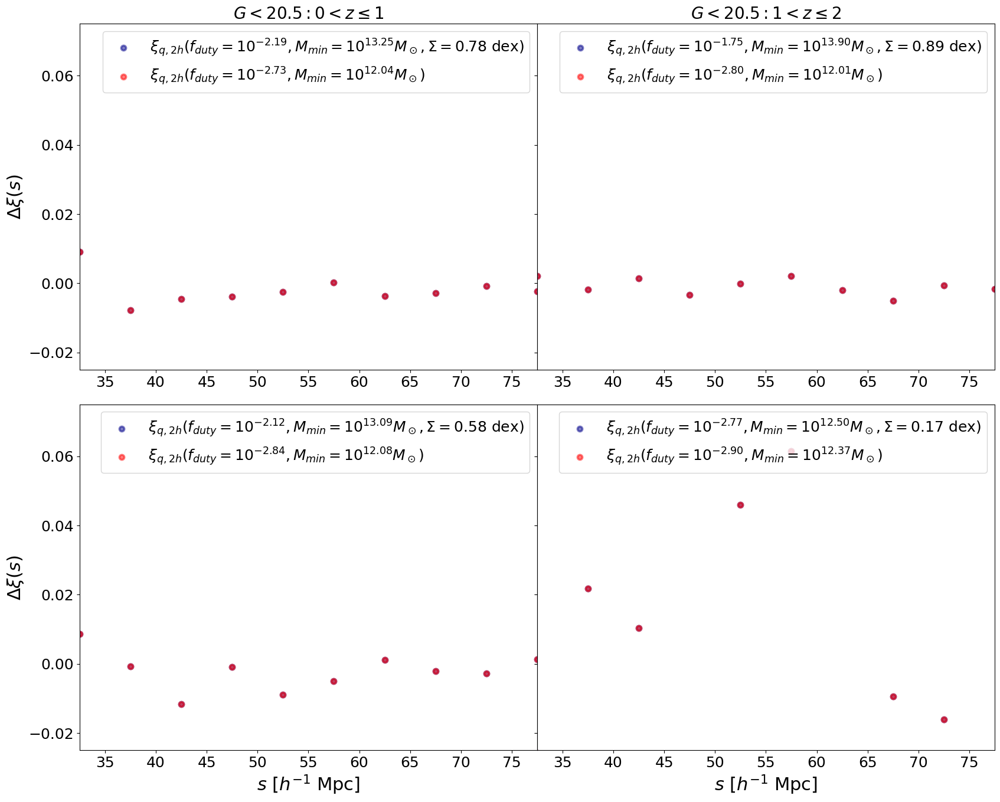

In [97]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, hspace = 0.1, wspace = 0)

k = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good

    if quaia.recenter(rbins_chi2)[0] < 30:
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                          alpha = 0.5, label = 'scales excluded from fit')
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                          alpha = 0.5)

    # plot new fit from erfc HOD
    f_duty_erfc, M_min_erfc, sigma_erfc = best_fit_params[j]
    n_m=HOD_scatter(10**f_duty_erfc, M_min_erfc, bins, sigma_erfc)
    cf_2h_zbin_erfc, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.scatter(quaia.recenter(rbins_chi2), cf_2h_zbin_erfc-cf_chi2[j], linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty_erfc, M_min_erfc, 
                                                                                                                           sigma_erfc), 
             color = 'darkblue', alpha = 0.5)

    # plot new fit from step_function HOD
    f_duty_step, M_min_step = best_fit_params_step[j]
    n_m=np.ones(np.shape(bins))*10**f_duty_step
    cf_2h_zbin_step, b_q = cf_2h(np.logspace(M_min_step,M_max,79), n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.scatter(quaia.recenter(rbins_chi2), cf_2h_zbin_step-cf_chi2[j], linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(f_duty_step, M_min_step), 
             color = 'red', alpha = 0.5)

    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    # ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(-0.025, 0.075)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\Delta\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j % 2 != 0:
        k+=2

plt.show()

## Plot results

In [109]:
zbin = 1/np.array(a_zbin)-1

In [110]:
z_eff = [0.5, 1.5, 2.5, 3.5]

In [111]:
fduty_err_hi = 0.002, 0.001, 0.008, 0.077
fduty_err_lo = 0.002, 0.001, 0.007, 0.034

In [112]:
M_min_err_hi = [0.04, 0.02, 0.03, 0.1]
M_min_err_lo = [0.05, 0.02, 0.03, 0.12]

In [113]:
M_min_step = np.load('../results/M_min_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask_sellentin_nlive{}_dlogz{}_penalty.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo, nlive, dlogz))

In [114]:
err_M_min = np.load('../results/log10(M_min)_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask_sellentin_nlive{}_dlogz{}_penalty.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo, nlive, dlogz))
M_min_lo_step, M_min_hi_step = err_M_min[:,0], err_M_min[:,1]

<>:2: SyntaxWarning: invalid escape sequence '\l'
<>:4: SyntaxWarning: invalid escape sequence '\S'
<>:8: SyntaxWarning: invalid escape sequence '\l'
<>:2: SyntaxWarning: invalid escape sequence '\l'
<>:4: SyntaxWarning: invalid escape sequence '\S'
<>:8: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_94396/1772349997.py:2: SyntaxWarning: invalid escape sequence '\l'
  plt.plot(zbin, M_min, color = 'darkblue', linewidth = 2.5, label = 'erfc HOD $(0\leq\Sigma<1.4)$')
/tmp/ipykernel_94396/1772349997.py:4: SyntaxWarning: invalid escape sequence '\S'
  plt.plot(zbin, M_min_step, color = 'red', linewidth = 2.5, label = 'step-function HOD $(\Sigma=0)$', linestyle = '--')
/tmp/ipykernel_94396/1772349997.py:8: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log_{10}(M_{min}/M_\odot)$')


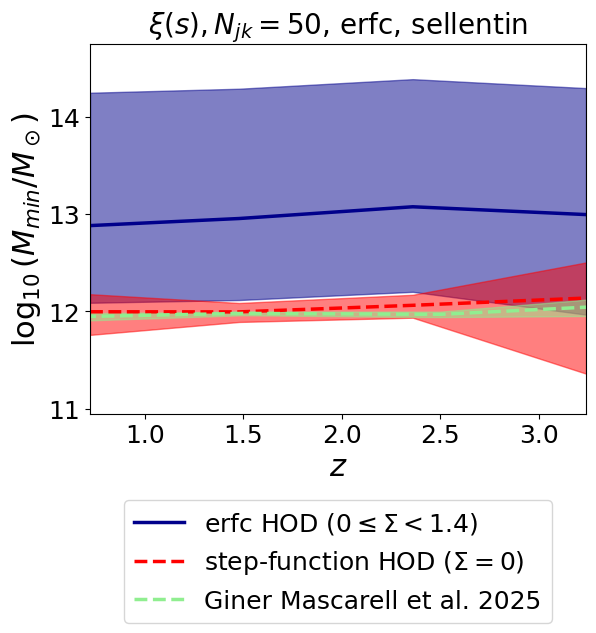

In [115]:
M_min_lo, M_min_hi = np.array(err['log10(M_min)'])[:,0], np.array(err['log10(M_min)'])[:,1]
plt.plot(zbin, M_min, color = 'darkblue', linewidth = 2.5, label = 'erfc HOD $(0\leq\Sigma<1.4)$')
plt.fill_between(zbin, M_min_lo, M_min_hi, alpha = 0.5, color = 'darkblue')
plt.plot(zbin, M_min_step, color = 'red', linewidth = 2.5, label = 'step-function HOD $(\Sigma=0)$', linestyle = '--')
plt.fill_between(zbin, M_min_lo_step, M_min_hi_step, alpha = 0.5, color = 'red')
plt.plot(z_eff, M_min_array, label = 'Giner Mascarell et al. 2025', color = 'lightgreen', linewidth = 2.5, linestyle = '--')
plt.fill_between(z_eff, M_min_array+np.array(M_min_array)/M_min_array_old*M_min_err_hi, M_min_array-np.array(M_min_array)/M_min_array_old*M_min_err_lo, alpha = 0.5, color = 'lightgreen')
plt.ylabel('$\log_{10}(M_{min}/M_\odot)$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
plt.ylim(10.95,14.75)
plt.title(r'$\xi(s), N_{{jk}}={}$, erfc, sellentin'.format(N))
plt.show()

In [83]:
f_duty_step = np.load('../results/f_duty_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask_sellentin_nlive{}_dlogz{}_penalty.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo, nlive, dlogz))

In [84]:
err_f_duty= np.load('../results/log10(f_duty)_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask_sellentin_nlive{}_dlogz{}_penalty.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], N, cosmo, nlive, dlogz))
f_duty_lo_step, f_duty_hi_step = err_f_duty[:,0], err_f_duty[:,1]

<>:2: SyntaxWarning: invalid escape sequence '\l'
<>:4: SyntaxWarning: invalid escape sequence '\S'
<>:8: SyntaxWarning: invalid escape sequence '\l'
<>:2: SyntaxWarning: invalid escape sequence '\l'
<>:4: SyntaxWarning: invalid escape sequence '\S'
<>:8: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_184092/1755863058.py:2: SyntaxWarning: invalid escape sequence '\l'
  plt.plot(zbin, f_duty, color = 'darkblue', linewidth = 2.5, label = 'erfc HOD $(0\leq\Sigma<1.4)$')
/tmp/ipykernel_184092/1755863058.py:4: SyntaxWarning: invalid escape sequence '\S'
  plt.plot(zbin, f_duty_step, color = 'red', linestyle = '--', linewidth = 2.5, label = 'step-function HOD $(\Sigma=0)$')
/tmp/ipykernel_184092/1755863058.py:8: SyntaxWarning: invalid escape sequence '\l'
  plt.ylabel('$\log_{10}(f_{duty})$')


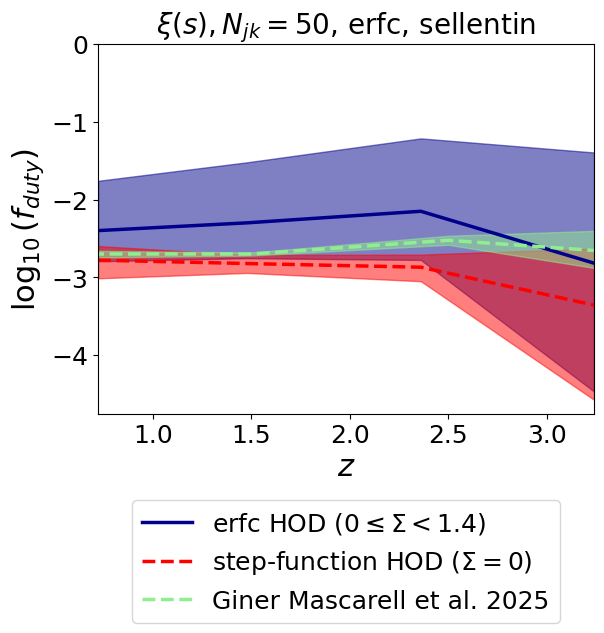

In [85]:
f_duty_lo, f_duty_hi = np.array(err['log10(f_duty)'])[:,0], np.array(err['log10(f_duty)'])[:,1]
plt.plot(zbin, f_duty, color = 'darkblue', linewidth = 2.5, label = 'erfc HOD $(0\leq\Sigma<1.4)$')
plt.fill_between(zbin, f_duty_lo, f_duty_hi, alpha = 0.5, color = 'darkblue')
plt.plot(zbin, f_duty_step, color = 'red', linestyle = '--', linewidth = 2.5, label = 'step-function HOD $(\Sigma=0)$')
plt.fill_between(zbin, f_duty_lo_step, f_duty_hi_step, alpha = 0.5, color = 'red')
plt.plot(z_eff, np.log10(fduty), label = 'Giner Mascarell et al. 2025', color = 'lightgreen', linewidth = 2.5, linestyle = '--')
plt.fill_between(z_eff, np.log10(np.array(fduty)+np.array(fduty)/fduty_old*fduty_err_hi), np.log10(np.array(fduty)-np.array(fduty)/fduty_old*fduty_err_lo), alpha = 0.5, color = 'lightgreen')
plt.ylabel('$\log_{10}(f_{duty})$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
plt.ylim(-4.75,0)
plt.title(r'$\xi(s), N_{{jk}}={}$, erfc, sellentin'.format(N))
plt.show()

<>:2: SyntaxWarning: invalid escape sequence '\l'
<>:4: SyntaxWarning: invalid escape sequence '\S'
<>:5: SyntaxWarning: invalid escape sequence '\S'
<>:2: SyntaxWarning: invalid escape sequence '\l'
<>:4: SyntaxWarning: invalid escape sequence '\S'
<>:5: SyntaxWarning: invalid escape sequence '\S'
/tmp/ipykernel_184092/19443411.py:2: SyntaxWarning: invalid escape sequence '\l'
  plt.plot(zbin, sigma, color = 'darkblue', linewidth = 2.5, label = 'erfc HOD $(0\leq\Sigma<1.4)$')
/tmp/ipykernel_184092/19443411.py:4: SyntaxWarning: invalid escape sequence '\S'
  plt.axhline(0, color = 'red', linestyle = '--', label = 'step-function HOD $(\Sigma=0)$')
/tmp/ipykernel_184092/19443411.py:5: SyntaxWarning: invalid escape sequence '\S'
  plt.ylabel('$\Sigma$')


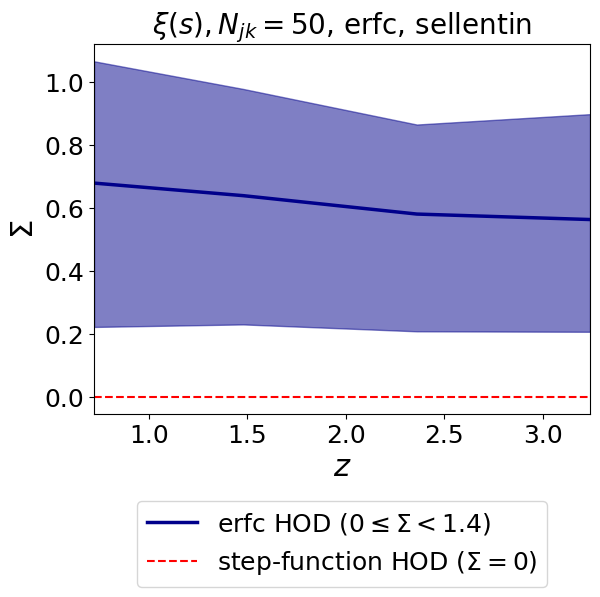

In [86]:
sigma_lo, sigma_hi = np.array(err['sigma'])[:,0], np.array(err['sigma'])[:,1]
plt.plot(zbin, sigma, color = 'darkblue', linewidth = 2.5, label = 'erfc HOD $(0\leq\Sigma<1.4)$')
plt.fill_between(zbin, sigma_lo, sigma_hi, alpha = 0.5, color = 'darkblue')
plt.axhline(0, color = 'red', linestyle = '--', label = 'step-function HOD $(\Sigma=0)$')
plt.ylabel('$\Sigma$')
plt.xlabel('$z$')
plt.legend(bbox_to_anchor = (0.5, -0.2), loc='upper center')
plt.xlim(zbin[0], zbin[-1])
plt.title(r'$\xi(s), N_{{jk}}={}$, erfc, sellentin'.format(N))
plt.show()

In [80]:
b_eff_cf20 = np.load('../results/b_eff_cf20_planck18.npy')

## Calculate 16th and 84th percentile of derived parameters

<>:64: SyntaxWarning: invalid escape sequence '\l'
<>:64: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_205391/3427952495.py:64: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))


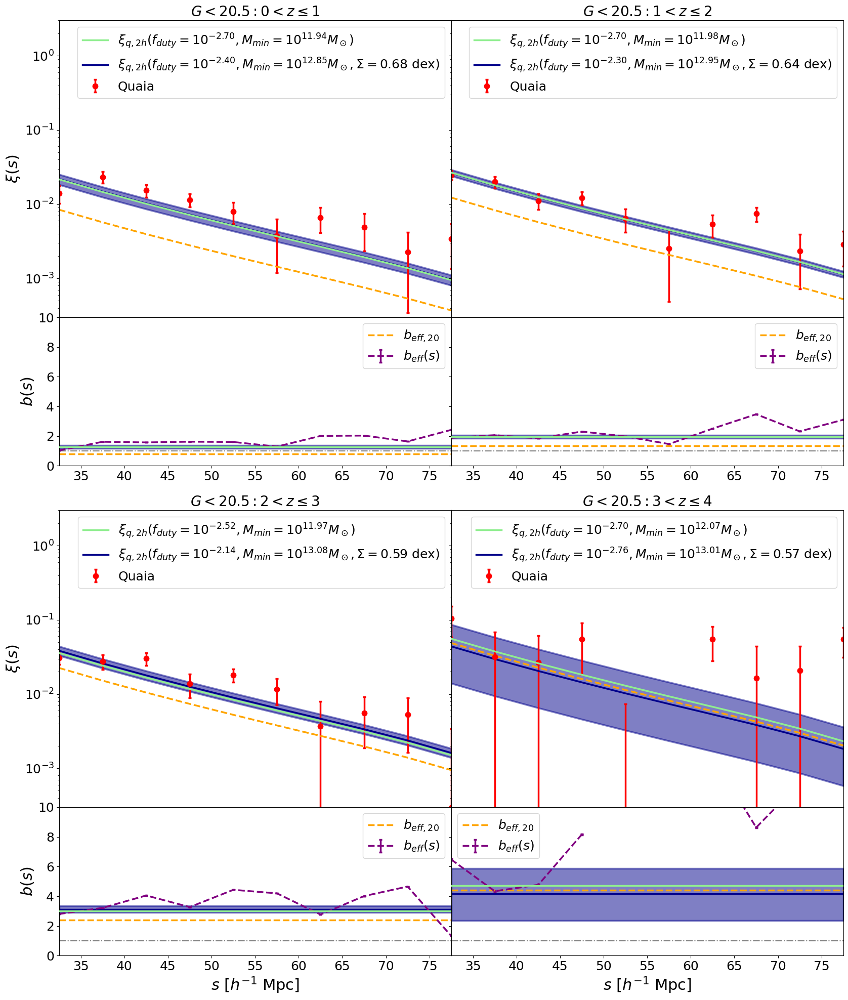

In [81]:
fig = plt.figure(figsize = (20, 24))
gs = gridspec.GridSpec(5, 2, height_ratios = [1, 0.5, 0.15, 1, 0.5], hspace = 0, wspace = 0)

k = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+k])
    ax2 = fig.add_subplot(gs[j+k+2])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    ax1.errorbar(quaia.recenter(rbins_chi2), cf_chi2[j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = 'red',
                yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
    ax1.plot(quaia.recenter(rbins_chi2), b_eff_cf20[j]**2*cf_matter_chi2[j], linewidth = 2.5,
             color = 'orange', linestyle = '--')
    if quaia.recenter(rbins_chi2)[0] < 30:
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                          alpha = 0.5)
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                          alpha = 0.5)

    # old fit
    cf_2h_zbin, b_q = cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5, 
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot)$'.format(np.log10(fduty[j]), M_min_array[j]),
             color = 'lightgreen', zorder = 3)
    ax2.axhline(b_q, linewidth = 2.5, color = 'lightgreen', zorder = 3)

    # plot new fit
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')
    
    cf_2h_samples, b_q_samples=[], []
    for i in range(len(ind)):
        n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i])
        cf_2h_sample, b_q_sample = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)
        cf_2h_samples.append(cf_2h_sample)
        b_q_samples.append(b_q_sample)
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    b_q_16, b_q_50, b_q_84 = np.percentile(b_q_samples, [16, 50, 84])

    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')
    ax2.axhline(b_q, linewidth = 2.5, color = 'darkblue')
    ax2.fill_between(quaia.recenter(rbins_chi2), [b_q_16]*nbins, [b_q_84]*nbins, linewidth = 2.5, color = 'darkblue', alpha = 0.5)

    if quaia.recenter(rbins_chi2)[0] < 30:
        ax2.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                          alpha = 0.5, label = 'scales excluded from fit')
        ax2.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                          alpha = 0.5)
    ax2.errorbar(quaia.recenter(rbins_chi2), b_cf_chi2[j], linewidth = 2.5, linestyle = '--', markeredgewidth = 2.5, capsize = 2.5,
                 color = 'purple', yerr = np.sqrt(np.diag(C)), label = '$b_{eff}(s)$')
    ax2.axhline(b_eff_cf20[j], linewidth = 2.5, color = 'orange', linestyle = '--', label = r'${b_{eff, 20}}$')
    
    if (j + k) % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_xticklabels([])
    ax1.set_ylim(3e-4, 3)
    ax1.legend()

    ax2.axhline(1, linestyle = '-.', color = 'black', alpha = 0.5)
    ax2.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax2.set_ylim(0, 10)
    ax2.legend()
    
    if (j+k) % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')
        ax2.set_ylabel(r'$b(s)$')

    else:
        ax1.set_yticklabels([])
        ax2.set_yticklabels([])

    if k != 0:
        ax2.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j % 2 != 0:
        k+=4

plt.show()

<>:40: SyntaxWarning: invalid escape sequence '\l'
<>:40: SyntaxWarning: invalid escape sequence '\l'
/tmp/ipykernel_205391/48301224.py:40: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))


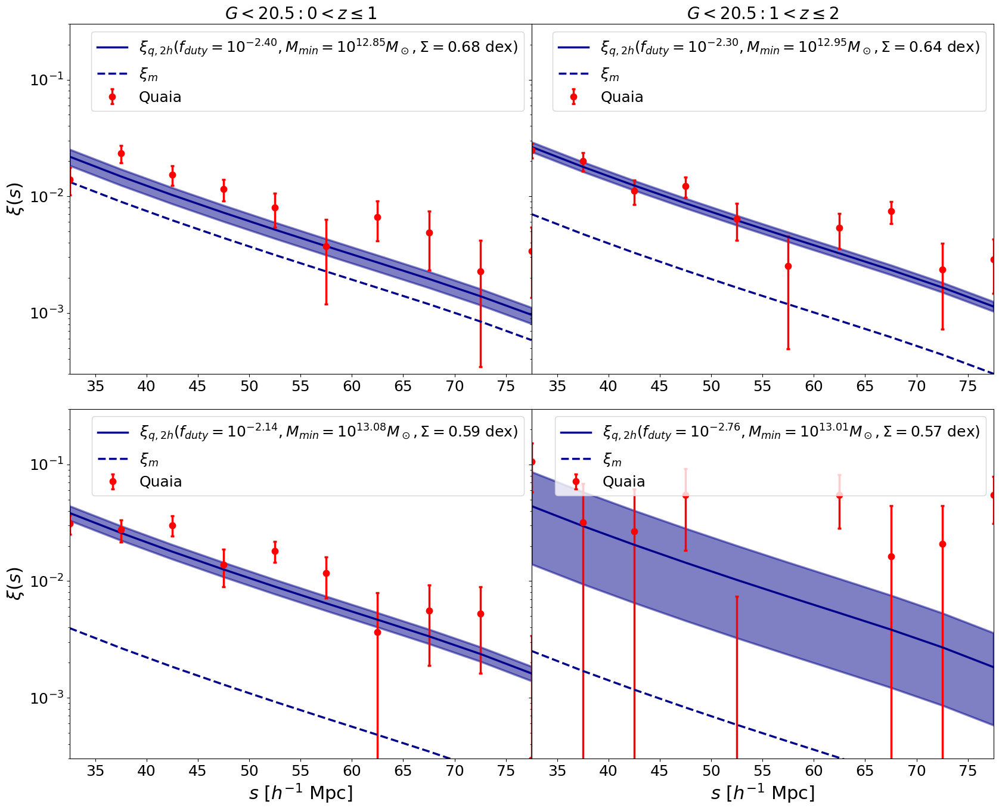

In [82]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 2, hspace = 0.1, wspace = 0)

k = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    ax1.errorbar(quaia.recenter(rbins_chi2), cf_chi2[j], linewidth = 2.5, marker = 'o', label = r'Quaia', color = 'red',
                yerr = np.sqrt(np.diag(C)), markeredgewidth = 2.5, capsize = 2.5, linestyle = 'none')
    if quaia.recenter(rbins_chi2)[0] < 30:
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                          alpha = 0.5, label = 'scales excluded from fit')
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                          alpha = 0.5)

    # plot new fit
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')
    ax1.plot(quaia.recenter(rbins_chi2), cf_matter_chi2[j], linewidth = 2.5,
             label = r'$\xi_{{m}}$', linestyle = '--', 
             color = 'darkblue')

    cf_2h_samples = [cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[0] for i in range(len(ind))]
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')

    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j % 2 != 0:
        k+=2

plt.show()

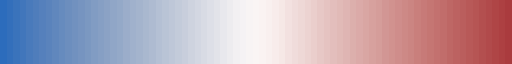

In [83]:
cmap_M_min = sns.color_palette("vlag", n_colors = len(bins))
palette_M_min = matplotlib.colors.ListedColormap(cmap_M_min)
palette_M_min

<>:42: SyntaxWarning: invalid escape sequence '\l'
<>:61: SyntaxWarning: invalid escape sequence '\D'
<>:42: SyntaxWarning: invalid escape sequence '\l'
<>:61: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_205391/1549512891.py:42: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
/tmp/ipykernel_205391/1549512891.py:61: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')


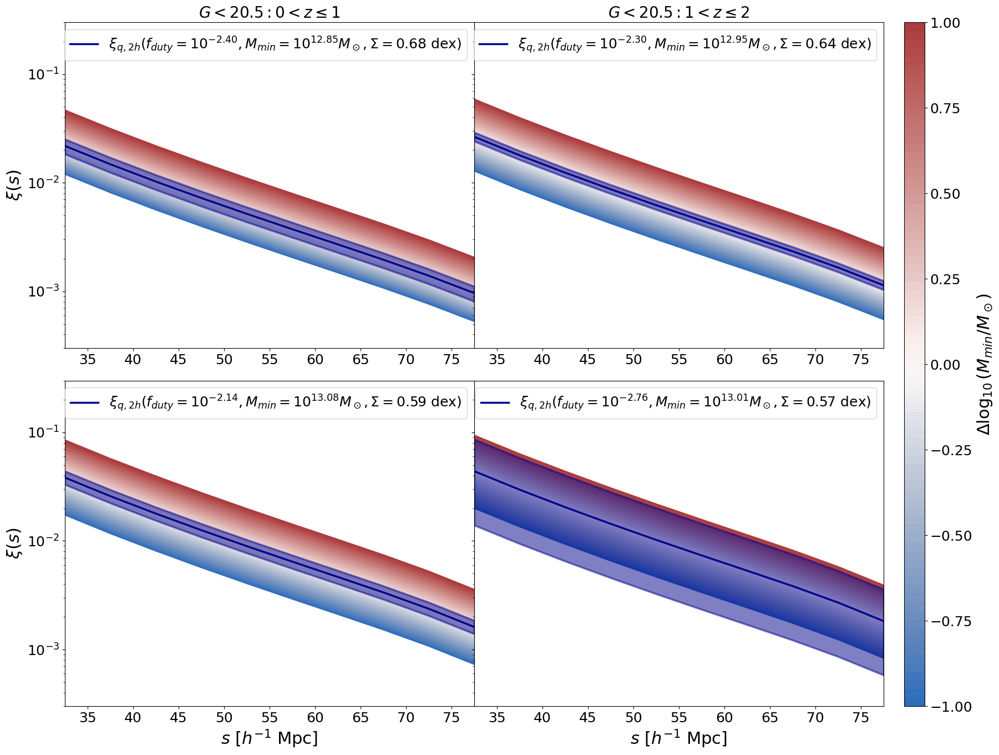

In [84]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 4, hspace = 0.1, wspace = 0, width_ratios = [1,1,0.05,0.05])

l = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+l])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    if quaia.recenter(rbins_chi2)[0] < 30:
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                      alpha = 0.5, label = 'scales excluded from fit')
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                      alpha = 0.5)

    # plot new fit
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')

    for k in range(len(bins)):
        M_min_k = M_min[j]-1+k/int(len(bins)/2)
        n_m=HOD_scatter(10**f_duty[j], M_min_k, bins, sigma[j])
        cf_2h_sample, _ = cf_2h(bins, n_m, a_zbin[j], 
                 cosmo_planck18, cf_matter_chi2[j], recenter = False)
        ax1.plot(quaia.recenter(rbins_chi2), cf_2h_sample, linewidth = 2.5, color = cmap_M_min[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))
        
    cf_2h_samples = [cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[0] for i in range(len(ind))]
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')   
    
    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j == 1:
        l+=2

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[:,-1]), 
                label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
plt.show()

In [85]:
sigma_k_array = np.linspace(0,1.4, 51) #-4

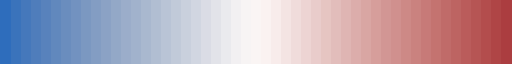

In [86]:
cmap_sigma = sns.color_palette("vlag", n_colors = len(sigma_k_array))
palette_sigma = matplotlib.colors.ListedColormap(cmap_sigma)
palette_sigma

In [87]:
delta = 0.1

<>:42: SyntaxWarning: invalid escape sequence '\l'
<>:61: SyntaxWarning: invalid escape sequence '\D'
<>:42: SyntaxWarning: invalid escape sequence '\l'
<>:61: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_205391/4046597407.py:42: SyntaxWarning: invalid escape sequence '\l'
  ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
/tmp/ipykernel_205391/4046597407.py:61: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


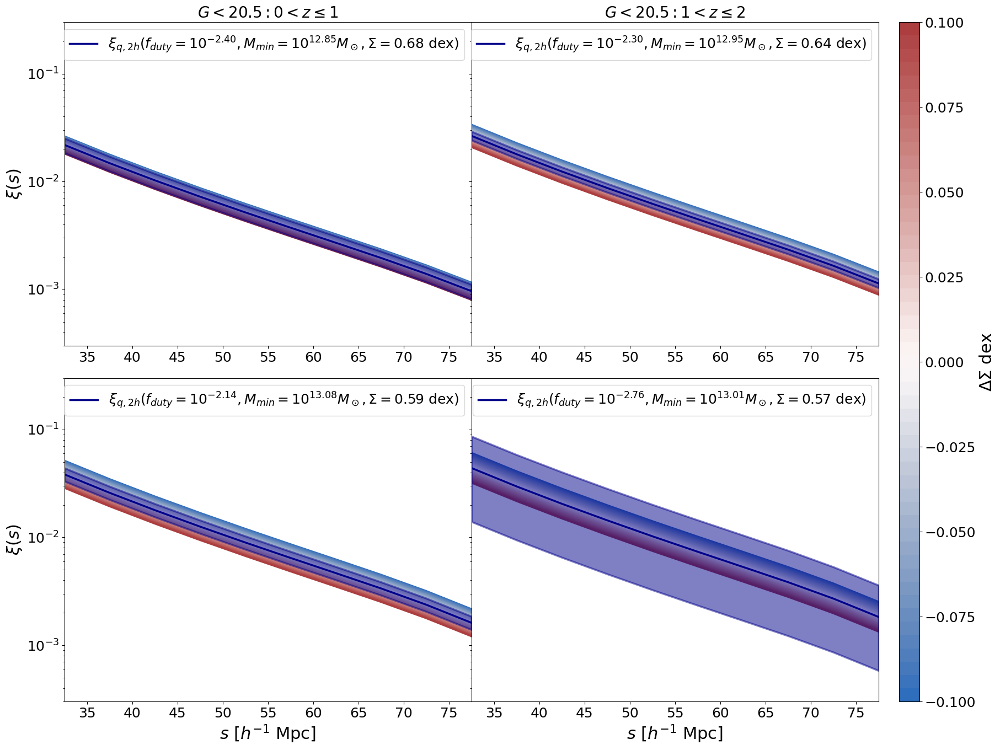

In [88]:
# remove bottom panel and just print bq somewhere
fig = plt.figure(figsize = (20, 16))
gs = gridspec.GridSpec(2, 4, hspace = 0.1, wspace = 0, width_ratios = [1,1,0.05,0.05])

l = 0
for j in z_array:

    ax1 = fig.add_subplot(gs[j+l])
    
    C = np.load('../results/cov_xi_G{}_rmin{}_rmax{}_nbins{}_zmin{:.1f}zmax{}_N{}_{}_MC_mask.npy'.format(G_hi, rmin, rmax, nbins, z_bins[j], z_bins[j+1], 
                                                                                                    N, cosmo)) # good
    
    if quaia.recenter(rbins_chi2)[0] < 30:
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = quaia.recenter(rbins_chi2)[0], x2 = 30, color = 'grey', 
                          alpha = 0.5, label = 'scales excluded from fit')
        ax1.fill_betweenx(np.linspace(3e-4, 5e1), x1 = 80, x2 = quaia.recenter(rbins_chi2)[-1], color = 'grey', 
                          alpha = 0.5)

    # plot new fit
    n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j])
    cf_2h_zbin, b_q = cf_2h(bins, n_m, a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                            recenter = False)
    ax1.plot(quaia.recenter(rbins_chi2), cf_2h_zbin, linewidth = 2.5,
             label = r'$\xi_{{q,2h}}(f_{{duty}}=10^{{{:.2f}}}, M_{{min}}=10^{{{:.2f}}}M_\odot, \Sigma={:.2f}$ dex)'.format(f_duty[j], M_min[j], 
                                                                                                                           sigma[j]), 
             color = 'darkblue')

    for k in range(len(sigma_k_array)):
        sigma_k = sigma[j]+delta*(-1+k/int(len(sigma_k_array)/2))
        n_m=HOD_scatter(10**f_duty[j], M_min[j], bins, sigma_k)
        cf_2h_sample, _ = cf_2h(bins, n_m, a_zbin[j], 
                 cosmo_planck18, cf_matter_chi2[j], recenter = False)
        ax1.plot(quaia.recenter(rbins_chi2), cf_2h_sample, linewidth = 2.5, color = cmap_sigma[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))

    cf_2h_samples = [cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[0] for i in range(len(ind))]
    cf_2h_16, cf_2h_50, cf_2h_84 = np.percentile(cf_2h_samples, [16, 50, 84], axis=0)
    ax1.fill_between(quaia.recenter(rbins_chi2), cf_2h_16, cf_2h_84, linewidth = 2.5, alpha = 0.5,
             color = 'darkblue')   
    
    if j % 6 < 2:
        ax1.set_title('$G<{}: {:.0f}<z \leq{:.0f}$'.format(G_hi, j, j+1))
    ax1.set_yscale('log')
    ax1.set_xlim(quaia.recenter(rbins_chi2)[0], quaia.recenter(rbins_chi2)[-1])
    ax1.set_ylim(3e-4, 3e-1)
    ax1.legend()
    
    if j % 2 == 0:
        ax1.set_ylabel(r'$\xi(s)$')

    else:
        ax1.set_yticklabels([])

    if j > 1:
        ax1.set_xlabel(r'$s$ $[h^{-1}$ Mpc]') # 
            
    if j == 1:
        l+=2

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=-delta, vmax = delta)), cax = fig.add_subplot(gs[:,-1]), 
                label = '$\Delta \Sigma$ dex')
plt.show()

In [89]:
b_q_percentile = []
for j in z_array:
    b_q_samples=[cf_2h(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
                                recenter = False)[1]for i in range(len(ind))]
    b_q_percentile.append(np.percentile(b_q_samples, [16, 84]))
b_q_lo, b_q_hi = np.array(b_q_percentile).T

<>:38: SyntaxWarning: invalid escape sequence '\D'
<>:85: SyntaxWarning: invalid escape sequence '\D'
<>:38: SyntaxWarning: invalid escape sequence '\D'
<>:85: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_205391/1470031328.py:38: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
/tmp/ipykernel_205391/1470031328.py:85: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


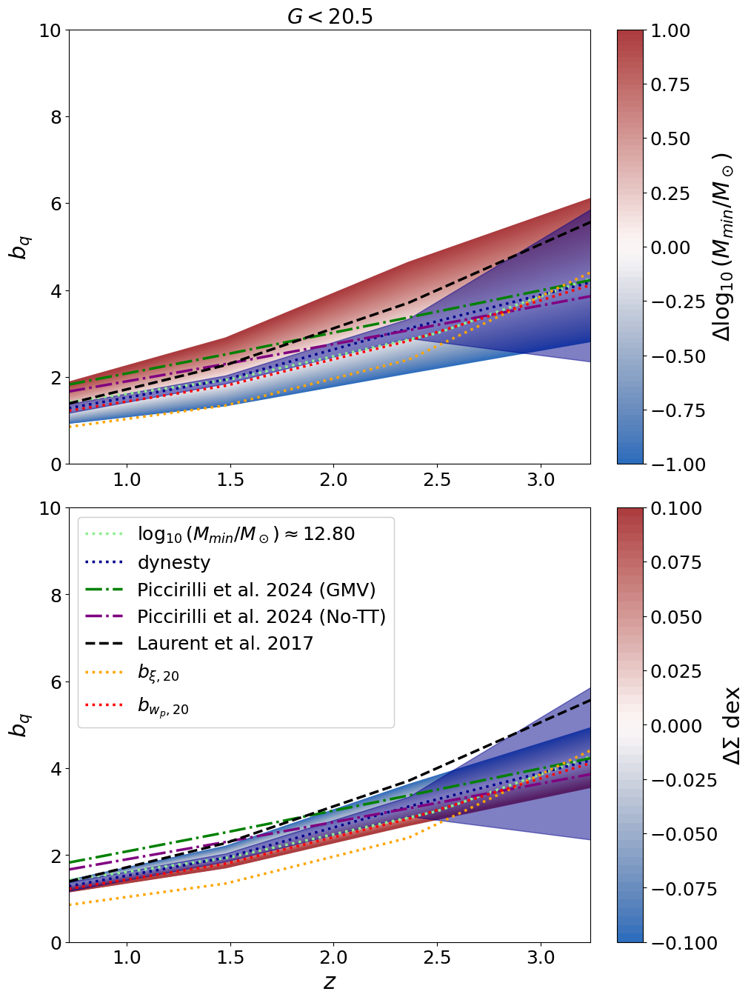

In [90]:
fig = plt.figure(figsize = (10, 16))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(2, 3, width_ratios = [1, 0.05, 0.05], wspace = 0, hspace = 0.1)
ax1 = fig.add_subplot(gs[0])
    
b_q = [cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
             recenter = False)[1] for j in z_array]
ax1.plot(z_eff, b_q, linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a_zbin[j], cosmo_planck18, 
                 cf_matter_chi2[j], recenter = False)[1] for j in z_array]
ax1.plot(zbin, b_q, linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, b_q_lo, b_q_hi, alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

for k in range(len(bins)):
        
    b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a_zbin[j], 
                     cosmo_planck18, cf_matter_chi2[j], recenter = False)[1] for j in z_array]
    ax1.plot(zbin, b_q, linewidth = 2.5, color = cmap_M_min[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.plot(zbin, b_quaia(1.26, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (GMV)', color = 'green') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_quaia(1.15, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (No-TT)', color = 'purple') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_eboss(zbin), linestyle = '--', linewidth = 2.5, label = 'Laurent et al. 2017', 
         color = 'black') # eq 3.6 in https://arxiv.org/abs/2402.05761

ax1.plot(zbin, b_cf20, linestyle = ':', linewidth = 2.5, label = r'$b_{\xi, 20}$', color = 'orange') 
ax1.plot(zbin, b_wp20, linestyle = ':', linewidth = 2.5, label = '$b_{w_p, 20}$', color = 'red') 

ax1.set_title('$G<{}$'.format(G_hi))

ax1.set_ylim(0, 10)
ax1.set_xlim(zbin[0], zbin[-1])
ax1.set_ylabel(r'$b_q$')

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[0,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')

ax1 = fig.add_subplot(gs[3])
    
b_q = [cf_2h(bins_M_min[j], n_m_array[j], a_zbin[j], cosmo_planck18, cf_matter_chi2[j], 
             recenter = False)[1] for j in z_array]
ax1.plot(z_eff, b_q, linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a_zbin[j], cosmo_planck18, 
                 cf_matter_chi2[j], recenter = False)[1] for j in z_array]
ax1.plot(zbin, b_q, linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, b_q_lo, b_q_hi, alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

for k in range(len(sigma_k_array)):
        
    b_q=[cf_2h(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]+delta*(-1+k/int(len(sigma_k_array)/2))), a_zbin[j], 
                     cosmo_planck18, cf_matter_chi2[j], recenter = False)[1] for j in z_array]
    ax1.plot(zbin, b_q, linewidth = 2.5, color = cmap_sigma[k], zorder = 0) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.plot(zbin, b_quaia(1.26, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (GMV)', color = 'green') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_quaia(1.15, a_zbin), linestyle = '-.', linewidth = 2.5, 
         label = 'Piccirilli et al. 2024 (No-TT)', color = 'purple') # eq 3.6 in https://arxiv.org/abs/2402.05761
ax1.plot(zbin, b_eboss(zbin), linestyle = '--', linewidth = 2.5, label = 'Laurent et al. 2017', 
         color = 'black') # eq 3.6 in https://arxiv.org/abs/2402.05761

ax1.plot(zbin, b_cf20, linestyle = ':', linewidth = 2.5, label = r'$b_{\xi, 20}$', color = 'orange') 
ax1.plot(zbin, b_wp20, linestyle = ':', linewidth = 2.5, label = '$b_{w_p, 20}$', color = 'red') 

ax1.set_xlabel('$z$')
ax1.set_ylim(0, 10)
ax1.set_xlim(zbin[0], zbin[-1])
ax1.set_ylabel(r'$b_q$')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5),
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5),
                Line2D([0], [0], color = 'green', linestyle = '-.', linewidth = 2.5), 
                Line2D([0], [0], color = 'purple', linestyle = '-.', linewidth = 2.5),
                Line2D([0], [0], color = 'black', linestyle = '--', linewidth = 2.5), 
                Line2D([0], [0], color = 'orange', linestyle = ':', linewidth = 2.5), 
                Line2D([0], [0], color = 'red', linestyle = ':', linewidth = 2.5)]
second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
                                          'dynesty', 'Piccirilli et al. 2024 (GMV)', 'Piccirilli et al. 2024 (No-TT)', 
                                          'Laurent et al. 2017', r'$b_{\xi, 20}$', '$b_{w_p, 20}$'])
fig.add_artist(second_legend)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=-delta, vmax = delta)), cax = fig.add_subplot(gs[1,-1]), 
                    label = '$\Delta \Sigma$ dex')
plt.show()

In [91]:
M_h_percentile = []
for j in z_array:
    M_h_samples=[]
    for i in range(len(ind)):
        n_m=HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i])
        M_h_samples.append(M(bins, n_m, a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0])
    M_h_percentile.append(np.percentile(M_h_samples, [16, 84]))
M_h_lo, M_h_hi = np.array(M_h_percentile).T

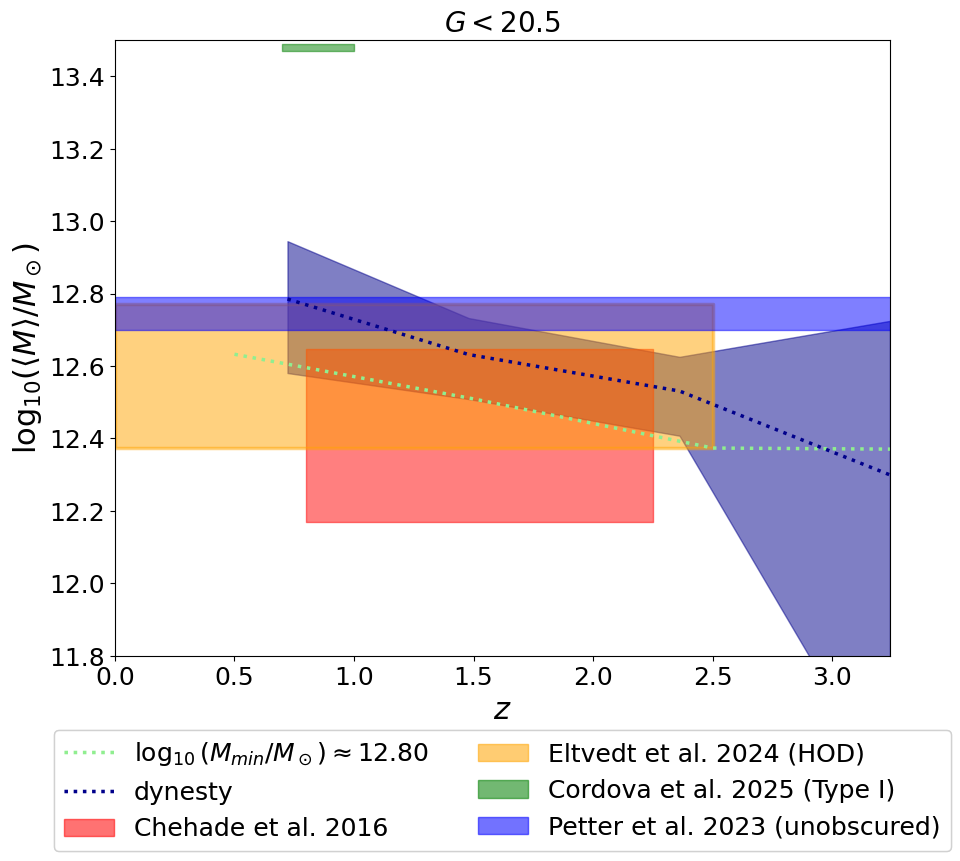

In [92]:
fig = plt.figure(figsize = (10, 8))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(1, 1, wspace = 0)
ax1 = fig.add_subplot(gs[0])
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(z_eff, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
ax1.set_title('$G<{}$'.format(G_hi))
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), 
                # mpatches.Patch(color='lightgreen', alpha = 0.5), 
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
                mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
second_legend = ax1.legend(custom_lines, [#'Giner Mascarell et al. 2025', 
                                          r'$\log_{{10}}(M_{{min}}/M_\odot)\approx{:.2f}$'.format(12.8), 
                                          'dynesty', 'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
                           ncol = 2, bbox_to_anchor = (0.5, -0.1), loc='upper center')
fig.add_artist(second_legend)

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

plt.show()

<>:38: SyntaxWarning: invalid escape sequence '\D'
<>:81: SyntaxWarning: invalid escape sequence '\D'
<>:38: SyntaxWarning: invalid escape sequence '\D'
<>:81: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_205391/3427163053.py:38: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
/tmp/ipykernel_205391/3427163053.py:81: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


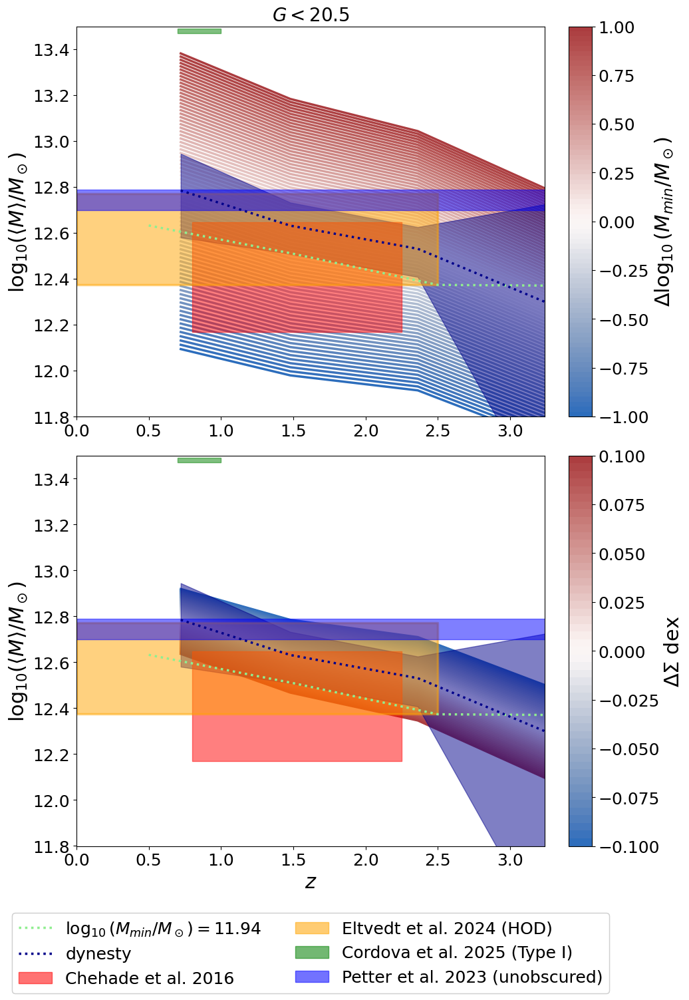

In [93]:
fig = plt.figure(figsize = (10, 16))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(2, 3, width_ratios = [1, 0.05, 0.05], wspace = 0, hspace = 0.1)
ax1 = fig.add_subplot(gs[0])

for k in range(len(bins)):
    
    M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
    ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, 
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:{:.2f} M_\odot$'.format(fduty[0]*100, fduty[-1]*100, np.log10(bins[k])),
             color = cmap_M_min[k], zorder = 0) #, alpha = (1+k)/len(bins))
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(z_eff, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
ax1.set_title('$G<{}$'.format(G_hi))
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[0,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')

ax1 = fig.add_subplot(gs[3])

for k in range(len(sigma_k_array)):
    
    M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]+delta*(-1+k/int(len(sigma_k_array)/2))), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
    ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, 
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:{:.2f} M_\odot$'.format(fduty[0]*100, fduty[-1]*100, np.log10(bins[k])),
             color = cmap_sigma[k], zorder = 0) #, alpha = (1+k)/len(bins))
    
M_h = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[0] for j in z_array]
ax1.plot(z_eff, np.log10(M_h), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))

M_h=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[0] for j in z_array]
ax1.plot(zbin, np.log10(M_h), linewidth = 2.5, color = 'darkblue', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(M_h_lo), np.log10(M_h_hi), alpha = 0.5, color = 'darkblue') # color = cmaps[i][j], alpha = (l+1)/len(bins))

z = np.linspace(0.8, 2.25)
ax1.fill_between(z, [np.log10(1e12/Planck18.h)]*len(z), [np.log10(3e12/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Chehade et al. 2016', color = 'red')
ax1.fill_between(np.linspace(0, 2.5), [np.log10(1.6e12/Planck18.h)]*len(z), [np.log10(4e12/Planck18.h)]*len(z), linewidth = 2.5, 
                 label = 'Eltvedt et al. 2024 (HOD)', alpha = 0.5, color = 'orange')
ax1.fill_between(np.linspace(0.7, 1), [13.47]*len(z), [13.49]*len(z), alpha = 0.5, label = 'Cordova et al. 2025 (Type I)', color = 'green')

# check redshift range and check cordova type i was right to include because conflicts with this
ax1.fill_between(np.linspace(0, 3.5), [np.log10(10**12.53/Planck18.h)]*len(z), [np.log10(10**12.62/Planck18.h)]*len(z), alpha = 0.5, 
                 label = 'Petter et al. 2023 (unobscured)', color = 'blue')

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5), Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5), mpatches.Patch(color='red', alpha = 0.5), 
                mpatches.Patch(color='orange', alpha = 0.5), mpatches.Patch(color='green', alpha = 0.5), mpatches.Patch(color='blue', alpha = 0.5)]
second_legend = ax1.legend(custom_lines, [r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0]), 'dynesty',
                            'Chehade et al. 2016', 'Eltvedt et al. 2024 (HOD)', 'Cordova et al. 2025 (Type I)', 'Petter et al. 2023 (unobscured)'], 
                           ncol = 2, bbox_to_anchor = (0.5, -0.15), loc='upper center')
fig.add_artist(second_legend)

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(\langle M \rangle/M_\odot)$')
ax1.set_xlim(0, zbin[-1])
ax1.set_ylim(11.8, 13.5)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=-delta, vmax = delta)), cax = fig.add_subplot(gs[1,-1]), 
                    label = '$\Delta \Sigma$ dex')
plt.show()

In [94]:
fduty_array = np.logspace(-5,0, 51) #-4

In [95]:
cmap_fduty_k = sns.color_palette("vlag", n_colors = len(fduty_array))

In [96]:
n_q_percentile = []
for j in z_array:
    n_q_samples=[M(bins, HOD_scatter(10**f_duty_samples[j][i], M_min_samples[j][i], bins, sigma_samples[j][i]), a = a_zbin[j], cosmo = cosmo_planck18, 
         recenter = False)[1] for i in range(len(ind))]
    n_q_percentile.append(np.percentile(n_q_samples, [16, 50, 84]))
n_q_theory_fit_lo, n_q_theory_fit_mid, n_q_theory_fit_hi = np.array(n_q_percentile).T

<>:38: SyntaxWarning: invalid escape sequence '\D'
<>:66: SyntaxWarning: invalid escape sequence '\D'
<>:91: SyntaxWarning: invalid escape sequence '\D'
<>:38: SyntaxWarning: invalid escape sequence '\D'
<>:66: SyntaxWarning: invalid escape sequence '\D'
<>:91: SyntaxWarning: invalid escape sequence '\D'
/tmp/ipykernel_205391/840610169.py:38: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(M_{min}/M_\odot)$')
/tmp/ipykernel_205391/840610169.py:66: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \log_{10}(f_{duty})$')
/tmp/ipykernel_205391/840610169.py:91: SyntaxWarning: invalid escape sequence '\D'
  label = '$\Delta \Sigma$ dex')


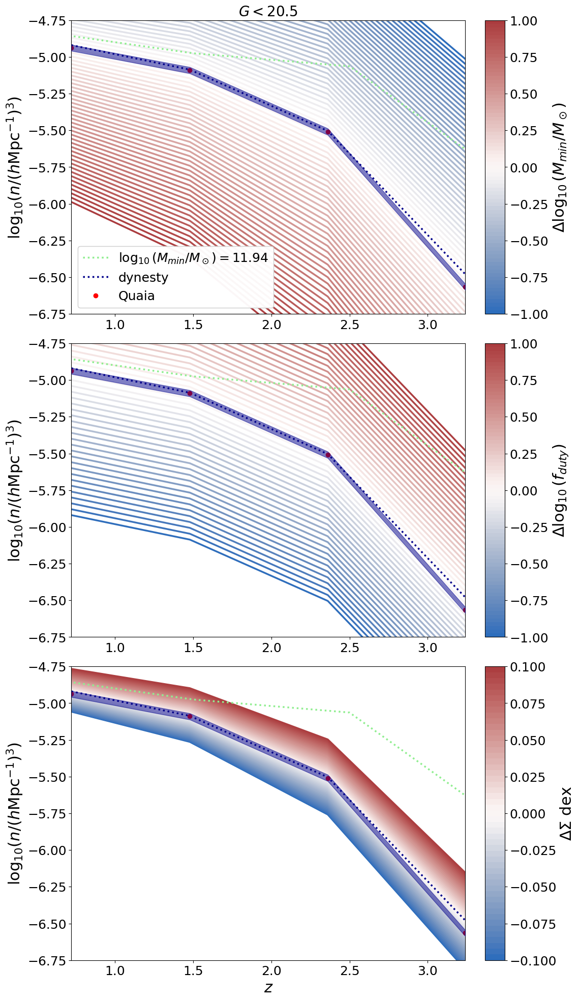

In [97]:
fig = plt.figure(figsize = (11, 24))
labels_cf = ['qq', r'$\xi_{2h}$']
gs = gridspec.GridSpec(3, 3, width_ratios = [1, 0.05, 0.05], wspace = 0, hspace = 0.1)
ax1 = fig.add_subplot(gs[0])
ylim = -6.75, -4.75

for k in range(len(bins)):
        
    n_q_theory=[M(bins, HOD_scatter(10**f_duty[j], M_min[j]-1+k/int(len(bins)/2), bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             label = r'$f_{{duty}}: {:.2f}\%-{:.2f}\%, M_{{min}}:[{:.2f}-{:.2f}] M_\odot$'.format(f_duty[0]*100, f_duty[-1]*100, np.log10(bins[0]), 
                                                                                                  np.log10(bins[-1])), color = cmap_M_min[k])

n_q_theory=[M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
n_q_theory_fit=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]

ax1.plot(z_eff, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'$\chi^2$ minimization') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, label = r'$\chi^2$ minimization', zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

ax1.set_title('$G<{}$'.format(G_hi))
ax1.set_xlim(zbin[0], zbin[-1])

custom_lines = [Line2D([0], [0], color = 'lightgreen', linestyle = ':', linewidth = 2.5, 
                       label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])),
                Line2D([0], [0], color = 'darkblue', linestyle = ':', linewidth = 2.5, 
                       label = 'dynesty'), 
                Line2D([0], [0], color = 'red', marker = 'o', linestyle = 'None', linewidth = 2.5, label = 'Quaia')]
second_legend = ax1.legend(handles = custom_lines)
fig.add_artist(second_legend)

ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[0,-1]), 
                    label = '$\Delta \log_{10}(M_{min}/M_\odot)$')

ax1 = fig.add_subplot(gs[3])
i = 1
l = 38

for k in range(len(fduty_array)):
        
    n_q_theory=[M(bins, HOD_scatter(10**(f_duty[j]-1+k/int(len(fduty_array)/2)), M_min[j], bins, sigma[j]), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]

    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             color = cmap_fduty_k[k])
    
n_q_theory = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
ax1.plot(z_eff, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':', 
         label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])) # color = cmaps[i][j], alpha = (l+1)/len(bins)) np.log10(bins[l])

ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'dynesty') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)
ax1.set_xlim(zbin[0], zbin[-1])

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_M_min, norm = matplotlib.colors.Normalize(vmin=-1, vmax = 1)), cax = fig.add_subplot(gs[1,-1]), 
                    label = '$\Delta \log_{10}(f_{duty})$')

ax1 = fig.add_subplot(gs[6])
for k in range(len(sigma_k_array)):
        
    n_q_theory=[M(bins, HOD_scatter(10**f_duty[j], M_min[j], bins, sigma[j]+delta*(-1+k/int(len(sigma_k_array)/2))), a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
    ax1.plot(zbin, np.log10(n_q_theory), linewidth = 2.5, #alpha = (1+k)/len(bins),
             color = cmap_sigma[k])
    
n_q_theory = [M(bins_M_min[j], n_m_array[j], a = a_zbin[j], cosmo = cosmo_planck18, recenter = False)[1] for j in z_array]
ax1.plot(z_eff, np.log10(n_q_theory), linewidth = 2.5, color = 'lightgreen', linestyle = ':', 
         label = r'$\log_{{10}}(M_{{min}}/M_\odot)={:.2f}$'.format(M_min_array[0])) # color = cmaps[i][j], alpha = (l+1)/len(bins)) np.log10(bins[l])

ax1.plot(zbin, np.log10(n_q_theory_fit), linewidth = 2.5, color = 'darkblue', linestyle = ':', label = r'dynesty') # color = cmaps[i][j], alpha = (l+1)/len(bins))
ax1.fill_between(zbin, np.log10(n_q_theory_fit_lo), np.log10(n_q_theory_fit_hi), color = 'darkblue', alpha = 0.5, zorder = 3) # color = cmaps[i][j], alpha = (l+1)/len(bins))

ax1.errorbar(zbin, np.log10(n_q), linewidth = 2.5, marker = 'o', label = 'Quaia', color = 'red',
             yerr = [np.log10(n_q)-np.log10(np.subtract(n_q, n_q_err)), np.log10(np.add(n_q, n_q_err))-np.log10(n_q)], linestyle = 'None')

ax1.set_xlabel('$z$')
ax1.set_ylabel(r'log$_{10}(n/(h\mathrm{Mpc}^{-1})^3)$')
ax1.set_ylim(ylim)
ax1.set_xlim(zbin[0], zbin[-1])

cbar = fig.colorbar(cm.ScalarMappable(cmap=palette_sigma, norm = matplotlib.colors.Normalize(vmin=-delta, vmax = delta)), cax = fig.add_subplot(gs[2,-1]), 
                    label = '$\Delta \Sigma$ dex')
plt.show()